# Import the necessary componenets and define all the distances. All distances are defined in meters.

In [76]:
import proper
import numpy as np
from scipy.interpolate import interp1d
import astropy.io.fits as pyfits
import math
from wfirst_phaseb_proper import trim, mft2, ffts, polmap
import wfirst_phaseb_proper
import os
import astropy.io.fits as fits
import matplotlib.pyplot as plt
from matplotlib.colors import LogNorm
from matplotlib.patches import Circle
plt.rcParams.update({'image.origin': 'lower',
                     'image.interpolation':"nearest"})
print(proper.__version__)
def radius( n ):
    x = np.arange( n ) - int(n)//2
    r = np.sqrt( x*x + x[:,np.newaxis]**2 )
    return r

def angle( n ):
    x = np.arange( n ) - int(n)//2
    return np.arctan2( x[:,np.newaxis], x ) * (180 / np.pi)

lambda0_m = 730e-9
diam = 2.3633372
mas_per_lamD = lambda0_m * 360.0 * 3600.0 / (2 * np.pi * diam) * 1000    # mas per lambda0/D
print(mas_per_lamD)

fl_pri = 2.83459423440 * 1.0013
d_pri_sec = 2.285150515460035
d_focus_sec = d_pri_sec - fl_pri
fl_sec = -0.653933011 * 1.0004095
d_sec_focus = 3.580188916677103
diam_sec = 0.58166
d_sec_fold1 = 2.993753476654728
d_fold1_focus = 0.586435440022375
diam_fold1 = 0.09
d_fold1_m3 = 1.680935841598811
fl_m3 = 0.430216463069001
d_focus_m3 = 1.094500401576436
d_m3_pupil = 0.469156807701977
d_m3_focus = 0.708841602661368
diam_m3 = 0.2
d_m3_m4 = 0.943514749358944
fl_m4 = 0.116239114833590
d_focus_m4 = 0.234673014520402
d_m4_pupil = 0.474357941656967
d_m4_focus = 0.230324117970585
diam_m4 = 0.07
d_m4_m5 = 0.429145636743193
d_m5_focus = 0.198821518772608
fl_m5 = 0.198821518772608
d_m5_pupil = 0.716529242882632
diam_m5 = 0.07
d_m5_fold2 = 0.351125431220770
diam_fold2 = 0.06
d_fold2_fsm = 0.365403811661862
d_fsm_oap1 = 0.354826767220001
fl_oap1 = 0.503331895563883
diam_oap1 = 0.06
d_oap1_focm = 0.768005607094041
d_focm_oap2 = 0.314483210543378
fl_oap2 = 0.579156922073536
diam_oap2 = 0.06
d_oap2_dm1 = 0.775775726154228
d_dm1_dm2 = 1.0
d_dm2_oap3 = 0.394833855161549
fl_oap3 = 1.217276467668519
diam_oap3 = 0.06
d_oap3_fold3 = 0.505329955078121
diam_fold3 = 0.06
d_fold3_oap4 = 1.158897671642761
fl_oap4 = 0.446951159052363
diam_oap4 = 0.06
d_oap4_pupilmask = 0.423013568764728
d_pupilmask_oap5 = 0.408810648253099
fl_oap5 =  0.548189351937178
diam_oap5 = 0.06
d_oap5_fpm = 0.548189083164429
d_fpm_oap6 = 0.548189083164429
fl_oap6 = 0.548189083164429
diam_oap6 = 0.06
d_oap6_lyotstop = 0.687567667550736
d_lyotstop_oap7 = 0.401748843470518
fl_oap7 = 0.708251083480054
diam_oap7 = 0.06
d_oap7_fieldstop = 0.708251083480054  
d_fieldstop_oap8 = 0.210985967281651
fl_oap8 = 0.210985967281651
diam_oap8 = 0.06
d_oap8_pupil = 0.238185804200797
d_oap8_filter = 0.368452268225530
diam_filter = 0.01
d_filter_lens = 0.170799548215162
fl_lens = 0.246017378417573 + 0.050001306014153
diam_lens = 0.01
d_lens_fold4 = 0.246017378417573
diam_fold4 = 0.02
d_fold4_image = 0.050001578514650
fl_pupillens = 0.149260576823040   

3.2.3
63.712156081823764


# Define an array of wavelengths and choose one to use for propagation. Also choose the final output dimension you want.

In [77]:
nlam = 7
lam0 = 0.730
bandwidth = 0.15
minlam = lam0 * (1 - bandwidth/2)
maxlam = lam0 * (1 + bandwidth/2)
lambda_array = np.linspace( minlam, maxlam, nlam )
lambda_array = np.array([lam0])
print(lambda_array)

lambda_m = lambda_array[0]*1e-6
print(lambda_m)

output_dim0 = 512

[0.73]
7.3e-07


# Define the default options and then decide on the options you want to use for propagation.

In [78]:
cor_type = 'spc-spec_long'
source_x_offset_mas = 0     # source offset in mas (tilt applied at primary)
source_y_offset_mas = 0                 
source_x_offset = 0         # source offset in lambda0_m/D radians (tilt applied at primary)
source_y_offset = 0                 
polaxis = 0                 # polarization axis aberrations: 
                            #    -2 = -45d in, Y out 
                            #    -1 = -45d in, X out 
                            #     1 = +45d in, X out 
                            #     2 = +45d in, Y out 
                            #     5 = mean of modes -1 & +1 (X channel polarizer)
                            #     6 = mean of modes -2 & +2 (Y channel polarizer)
                            #    10 = mean of all modes (no polarization filtering)
use_errors = 1              # use optical surface phase errors? 1 or 0 
zindex = np.array([0,0])    # array of Zernike polynomial indices
zval_m = np.array([0,0])    # array of Zernike coefficients (meters RMS WFE)
use_aperture = 0            # use apertures on all optics? 1 or 0
cgi_x_shift_pupdiam = 0     # X,Y shear of wavefront at FSM (bulk displacement of CGI); normalized relative to pupil diameter
cgi_y_shift_pupdiam = 0          
cgi_x_shift_m = 0           # X,Y shear of wavefront at FSM (bulk displacement of CGI) in meters
cgi_y_shift_m = 0          
fsm_x_offset_mas = 0        # offset in focal plane caused by tilt of FSM in mas
fsm_y_offset_mas = 0         
fsm_x_offset = 0            # offset in focal plane caused by tilt of FSM in lambda0/D
fsm_y_offset = 0            
end_at_fsm = 0              # end propagation after propagating to FSM (no FSM errors)
focm_z_shift_m = 0          # offset (meters) of focus correction mirror (+ increases path length)
use_hlc_dm_patterns = 0     # use Dwight's HLC default DM wavefront patterns? 1 or 0
use_dm1 = 0                 # use DM1? 1 or 0
use_dm2 = 0                 # use DM2? 1 or 0
dm_sampling_m = 0.9906e-3   # actuator spacing in meters
dm1_xc_act = 23.5           # for 48x48 DM, wavefront centered at actuator intersections: (0,0) = 1st actuator center
dm1_yc_act = 23.5              
dm1_xtilt_deg = 0           # tilt around X axis (deg)
dm1_ytilt_deg = 5.7         # effective DM tilt in deg including 9.65 deg actual tilt and pupil ellipticity
dm1_ztilt_deg = 0           # rotation of DM about optical axis (deg)
dm2_xc_act = 23.5           # for 48x48 DM, wavefront centered at actuator intersections: (0,0) = 1st actuator center
dm2_yc_act = 23.5               
dm2_xtilt_deg = 0           # tilt around X axis (deg)
dm2_ytilt_deg = 5.7         # effective DM tilt in deg including 9.65 deg actual tilt and pupil ellipticity
dm2_ztilt_deg = 0           # rotation of DM about optical axis (deg)
use_pupil_mask = 1          # SPC only: use SPC pupil mask (0 or 1)
mask_x_shift_pupdiam = 0    # X,Y shear of shaped pupil mask; normalized relative to pupil diameter
mask_y_shift_pupdiam = 0          
mask_x_shift_m = 0          # X,Y shear of shaped pupil mask in meters
mask_y_shift_m = 0          
use_fpm = 1                 # use occulter? 1 or 0
fpm_x_offset = 0            # FPM x,y offset in lambda0/D
fpm_y_offset = 0
fpm_x_offset_m = 0          # FPM x,y offset in meters
fpm_y_offset_m = 0
fpm_z_shift_m = 0           # occulter offset in meters along optical axis (+ = away from prior optics)
pinhole_diam_m = 0          # FPM pinhole diameter in meters
end_at_fpm_exit_pupil = 0   # return field at FPM exit pupil?
output_field_rootname = ''  # rootname of FPM exit pupil field file (must set end_at_fpm_exit_pupil=1)
use_lyot_stop = 1           # use Lyot stop? 1 or 0
lyot_x_shift_pupdiam = 0    # X,Y shear of Lyot stop mask; normalized relative to pupil diameter
lyot_y_shift_pupdiam = 0  
lyot_x_shift_m = 0          # X,Y shear of Lyot stop mask in meters
lyot_y_shift_m = 0  
use_field_stop = 1          # use field stop (HLC)? 1 or 0
field_stop_radius_lam0 = 0  # field stop radius in lambda0/D (HLC or SPC-wide mask only)
field_stop_x_offset = 0     # field stop offset in lambda0/D
field_stop_y_offset = 0
field_stop_x_offset_m = 0   # field stop offset in meters
field_stop_y_offset_m = 0
use_pupil_lens = 0          # use pupil imaging lens? 0 or 1
use_defocus_lens = 0        # use defocusing lens? Options are 1, 2, 3, 4, corresponding to +18.0, +9.0, -4.0, -8.0 waves P-V @ 550 nm 
defocus = 0                 # instead of specific lens, defocus in waves P-V @ 550 nm (-8.7 to 42.0 waves)
final_sampling_m = 0        # final sampling in meters (overrides final_sampling_lam0)
final_sampling_lam0 = 0     # final sampling in lambda0/D
output_dim = output_dim0    # dimension of output in pixels (overrides output_dim0)

## Select the important options.

In [79]:
cor_type = 'spc-spec_long'
source_x_offset = 0         # source offset in lambda0_m/D radians (tilt applied at primary)
source_y_offset = 0 

use_aperture = 0            # use apertures on all optics? 1 or 0

use_fpm = 0                 # use occulter? 1 or 0

use_pupil_mask = 1          # SPC only: use SPC pupil mask (0 or 1)
use_errors = 0              # use optical surface phase errors? 1 or 0 
use_pupil_lens = 0          # use pupil imaging lens? 0 or 1
use_defocus_lens = 0        # use defocusing lens? Options are 1, 2, 3, 4, corresponding to +18.0, +9.0, -4.0, -8.0 waves P-V @ 550 nm 
defocus = 0                 # instead of specific lens, defocus in waves P-V @ 550 nm (-8.7 to 42.0 waves)
use_field_stop = 1

use_hlc_dm_patterns = 0     # use Dwight's HLC default DM wavefront patterns? 1 or 0
use_dm1 = 0                 # use DM1? 1 or 0
use_dm2 = 0                 # use DM2? 1 or 0
if use_dm1 != 0: 
    dm1_m = proper.prop_fits_read( wfirst_phaseb_proper.lib_dir + '/examples/spc-wide_with_aberrations_dm1.fits' )
    print('DM1 loaded.')
if use_dm2 != 0: 
    dm2_m = proper.prop_fits_read( wfirst_phaseb_proper.lib_dir + '/examples/spc-wide_with_aberrations_dm2.fits' )
    print('DM2 loaded.')
dm_sampling_m = 0.9906e-3   # actuator spacing in meters
dm1_xc_act = 23.5           # for 48x48 DM, wavefront centered at actuator intersections: (0,0) = 1st actuator center
dm1_yc_act = 23.5              
dm1_xtilt_deg = 0           # tilt around X axis (deg)
dm1_ytilt_deg = 5.7         # effective DM tilt in deg including 9.65 deg actual tilt and pupil ellipticity
dm1_ztilt_deg = 0           # rotation of DM about optical axis (deg)
dm2_xc_act = 23.5           # for 48x48 DM, wavefront centered at actuator intersections: (0,0) = 1st actuator center
dm2_yc_act = 23.5               
dm2_xtilt_deg = 0           # tilt around X axis (deg)
dm2_ytilt_deg = 5.7         # effective DM tilt in deg including 9.65 deg actual tilt and pupil ellipticity
dm2_ztilt_deg = 0           # rotation of DM about optical axis (deg)

final_sampling_m = 0        # final sampling in meters (overrides final_sampling_lam0)
final_sampling_lam0 = 0.1     # final sampling in lambda0/D
output_dim = output_dim0    # dimension of output in pixels (overrides output_dim0)

pinhole_diam_m = 0          # FPM pinhole diameter in meters

polaxis = 0                 # polarization axis aberrations: 
                            #    -2 = -45d in, Y out 
                            #    -1 = -45d in, X out 
                            #     1 = +45d in, X out 
                            #     2 = +45d in, Y out 
                            #     5 = mean of modes -1 & +1 (X channel polarizer)
                            #     6 = mean of modes -2 & +2 (Y channel polarizer)
                            #    10 = mean of all modes (no polarization filtering)

# Define the file paths where the Phase-B data is located as well as sampling information.

In [80]:
is_spc = True
data_dir = '/home/u21/kianmilani/Documents/proper-tests'
polfile = data_dir + '/pol/' + 'new_toma' # directory containing the polarization information
map_dir = data_dir + '/maps/' # directory containing the wavefront error maps for components

file_dir = data_dir + '/spc_20190130/' # must have trailing "/"
pupil_diam_pix = 1000.0
pupil_file = file_dir + 'pupil_SPC-20190130_rotated.fits'
pupil_mask_file = file_dir + 'SPM_SPC-20190130.fits'
fpm_file = file_dir + 'fpm_0.05lamdivD.fits'
fpm_sampling = 0.05         # sampling in fpm_sampling_lambda_m/D of FPM mask 
if cor_type == 'spc-ifs_short' or cor_type == 'spc-spec_short':
    fpm_sampling_lambda_m = 0.66e-6
    lambda0_m = 0.66e-6
else:
    fpm_sampling_lambda_m = 0.73e-6
    lambda0_m = 0.73e-6     # FPM scaled for this central wavelength
lyot_stop_file = file_dir + 'LS_SPC-20190130.fits'
n_default = 2048            # gridsize in non-critical areas
n_to_fpm = 2048             # gridsize to/from FPM
n_mft = 1400                # gridsize to FPM (propagation to/from FPM handled by MFT)
n_from_lyotstop = 4096

Text(0.5, 1.0, 'Lyot Stop')

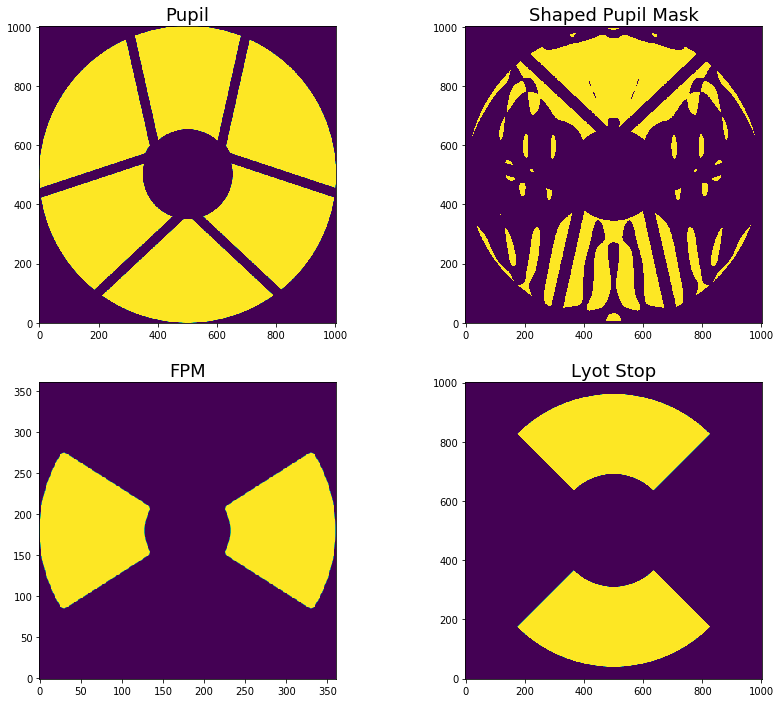

In [81]:
pupil = proper.prop_fits_read(pupil_file)
pupil_mask = proper.prop_fits_read(pupil_mask_file)
fpm = proper.prop_fits_read(fpm_file)
lyot_stop = proper.prop_fits_read(lyot_stop_file)

figwidth = 14
figheight = 12
fig, ax = plt.subplots(nrows=2, ncols=2, figsize=(figwidth,figheight) )
cbar_size = 1
fontsz = 18

im = ax[0][0].imshow(pupil, cmap=plt.get_cmap('viridis') )
ax[0][0].set_title('Pupil',fontsize=fontsz)

im = ax[0][1].imshow(pupil_mask, cmap=plt.get_cmap('viridis') )
ax[0][1].set_title('Shaped Pupil Mask',fontsize=fontsz)

im = ax[1][0].imshow(fpm, cmap=plt.get_cmap('viridis'))
ax[1][0].set_title('FPM',fontsize=fontsz)

im = ax[1][1].imshow(lyot_stop, cmap=plt.get_cmap('viridis') )
ax[1][1].set_title('Lyot Stop',fontsize=fontsz)

# Begin the propagation and initialize the wavefront object.

Applying lens
/home/u21/kianmilani/Documents/webbpsf-mydev/spc730-fresnel-wavefronts/wf_primary_proper.fits


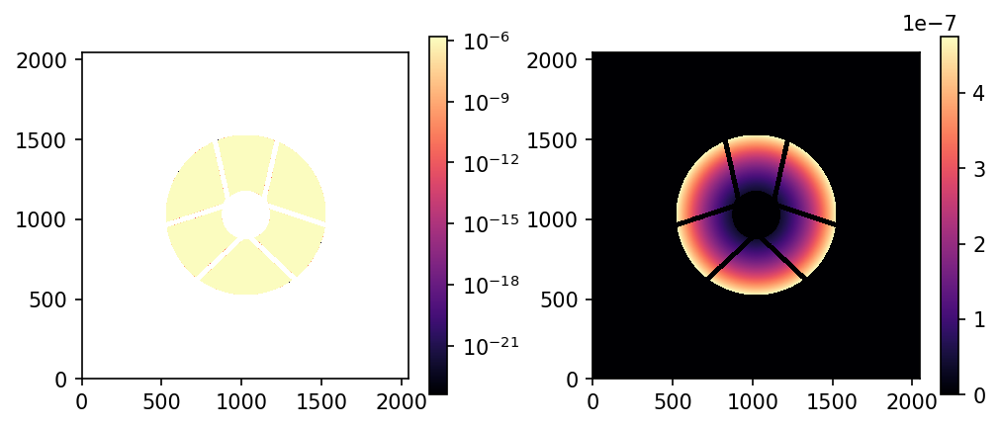

In [82]:
n = n_default # begin propagation using default pixel sampling
wavefront = proper.prop_begin( diam, lambda_m, n, float(pupil_diam_pix)/n )
pupil = proper.prop_fits_read( pupil_file )
proper.prop_multiply( wavefront, trim(pupil,n) )
pupil = 0
if polaxis != 0: polmap( wavefront, polfile, pupil_diam_pix, polaxis )
proper.prop_define_entrance( wavefront )
proper.prop_lens( wavefront, fl_pri )
if source_x_offset != 0 or source_y_offset != 0:
    print('Adjusting for source offset(s).')
    # compute tilted wavefront to offset source by xoffset,yoffset lambda0_m/D
    xtilt_lam = -source_x_offset * lambda0_m / lambda_m
    ytilt_lam = -source_y_offset * lambda0_m / lambda_m
    x = np.tile( (np.arange(n)-n//2)/(pupil_diam_pix/2.0), (n,1) )
    y = np.transpose(x)
    proper.prop_multiply( wavefront, np.exp(complex(0,1) * np.pi * (xtilt_lam * x + ytilt_lam * y)) )
    x = 0
    y = 0
if zindex[0] != 0: proper.prop_zernikes( wavefront, zindex, zval_m )
if use_errors != 0: 
    proper.prop_errormap( wavefront, map_dir+'wfirst_phaseb_PRIMARY_phase_error_V1.0.fits', WAVEFRONT=True )
    proper.prop_errormap( wavefront, map_dir+'wfirst_phaseb_GROUND_TO_ORBIT_4.2X_phase_error_V1.0.fits', WAVEFRONT=True )
    
wf_int = np.abs(proper.prop_get_amplitude(wavefront))**2
wf_phase = proper.prop_get_phase(wavefront)
wf_sampling = proper.prop_get_sampling(wavefront)

fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(8,4), dpi=150)
im = ax[0].imshow(wf_int, norm=LogNorm(), cmap=plt.get_cmap('magma'))
fig.colorbar(im, ax=ax[0], shrink=0.8)
im = ax[1].imshow(wf_phase, cmap=plt.get_cmap('magma'))
fig.colorbar(im, ax=ax[1], shrink=0.8)
plt.subplots_adjust(left=None, bottom=None, right=None, top=None, wspace=0.25, hspace=None)

wf = np.zeros(shape=(2,n,n))
wf[0,:,:] = wf_int
wf[1,:,:] = wf_phase

wf_dir = '/home/u21/kianmilani/Documents/webbpsf-mydev/spc730-fresnel-wavefronts/'
wf_fname = 'wf_primary'
wf_fpath =  wf_dir + wf_fname + '_proper' + '.fits'
print(wf_fpath)
hdr = fits.Header()
hdr['PIXELSCL'] = wf_sampling

wf_hdu = fits.PrimaryHDU(wf, header=hdr)
wf_hdu.writeto(wf_fpath, overwrite=True)

# Propagate to the secondary mirror.

Propagating to secondary
Applying lens
/home/u21/kianmilani/Documents/webbpsf-mydev/spc730-fresnel-wavefronts/wf_secondary_proper.fits


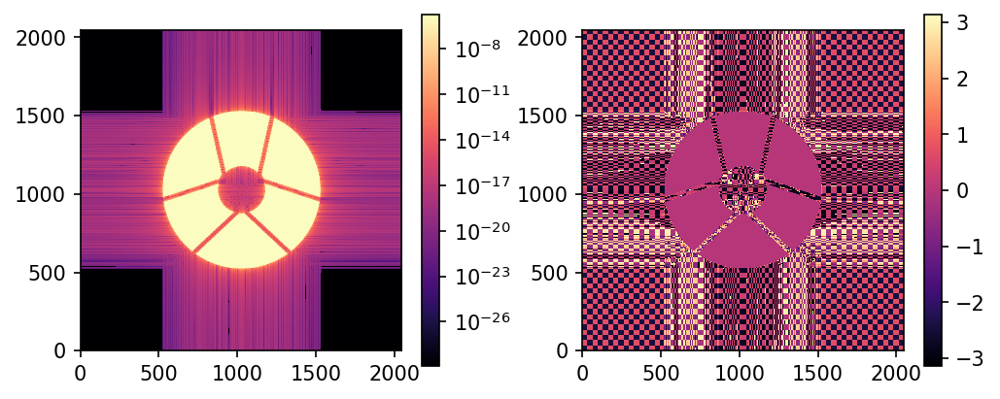

In [83]:
proper.prop_propagate( wavefront, d_pri_sec, 'secondary' )
proper.prop_lens( wavefront, fl_sec )
if use_errors != 0: proper.prop_errormap( wavefront, map_dir+'wfirst_phaseb_SECONDARY_phase_error_V1.0.fits', WAVEFRONT=True )
if use_aperture != 0: proper.prop_circular_aperture( wavefront, diam_sec/2.0 ) 
    
wf_int = np.abs(proper.prop_get_amplitude(wavefront))**2
wf_phase = proper.prop_get_phase(wavefront)
wf_sampling = proper.prop_get_sampling(wavefront)

fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(8,4), dpi=150)
im = ax[0].imshow(wf_int, norm=LogNorm(), cmap=plt.get_cmap('magma'))
fig.colorbar(im, ax=ax[0], shrink=0.8)
im = ax[1].imshow(wf_phase, cmap=plt.get_cmap('magma'))
fig.colorbar(im, ax=ax[1], shrink=0.8)
plt.subplots_adjust(left=None, bottom=None, right=None, top=None, wspace=0.25, hspace=None)

wf = np.zeros(shape=(2,n,n))
wf[0,:,:] = wf_int
wf[1,:,:] = wf_phase

wf_fname = 'wf_secondary'
wf_fpath = wf_dir + wf_fname + '_proper' + '.fits'
print(wf_fpath)
hdr = fits.Header()
hdr['PIXELSCL'] = wf_sampling

wf_hdu = fits.PrimaryHDU(wf, header=hdr)
wf_hdu.writeto(wf_fpath, overwrite=True)

# Propagate to the first fold mirror.

Propagating to FOLD_1
/home/u21/kianmilani/Documents/webbpsf-mydev/spc730-fresnel-wavefronts/wf_fold1_proper.fits


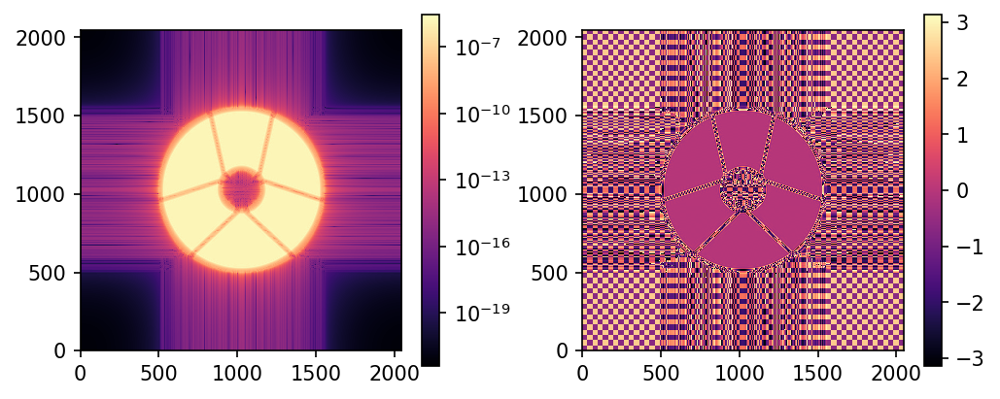

In [84]:
proper.prop_propagate( wavefront, d_sec_fold1, 'FOLD_1' )
if use_errors != 0: proper.prop_errormap( wavefront, map_dir+'wfirst_phaseb_FOLD1_phase_error_V1.0.fits', WAVEFRONT=True )
if use_aperture != 0: proper.prop_circular_aperture( wavefront, diam_fold1/2.0 ) 
    
wf_int = np.abs(proper.prop_get_amplitude(wavefront))**2
wf_phase = proper.prop_get_phase(wavefront)
wf_sampling = proper.prop_get_sampling(wavefront)

fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(8,4), dpi=150)
im = ax[0].imshow(wf_int, norm=LogNorm(), cmap=plt.get_cmap('magma'))
fig.colorbar(im, ax=ax[0], shrink=0.8)
im = ax[1].imshow(wf_phase, cmap=plt.get_cmap('magma'))
fig.colorbar(im, ax=ax[1], shrink=0.8)
plt.subplots_adjust(left=None, bottom=None, right=None, top=None, wspace=0.25, hspace=None)

wf = np.zeros(shape=(2,n,n))
wf[0,:,:] = wf_int
wf[1,:,:] = wf_phase

wf_fname = 'wf_fold1'
wf_fpath = wf_dir + wf_fname + '_proper' + '.fits'
print(wf_fpath)
hdr = fits.Header()
hdr['PIXELSCL'] = wf_sampling

wf_hdu = fits.PrimaryHDU(wf, header=hdr)
wf_hdu.writeto(wf_fpath, overwrite=True)

# Propagate to M3.

Propagating to M3
Applying lens
/home/u21/kianmilani/Documents/webbpsf-mydev/spc730-fresnel-wavefronts/wf_m3_proper.fits


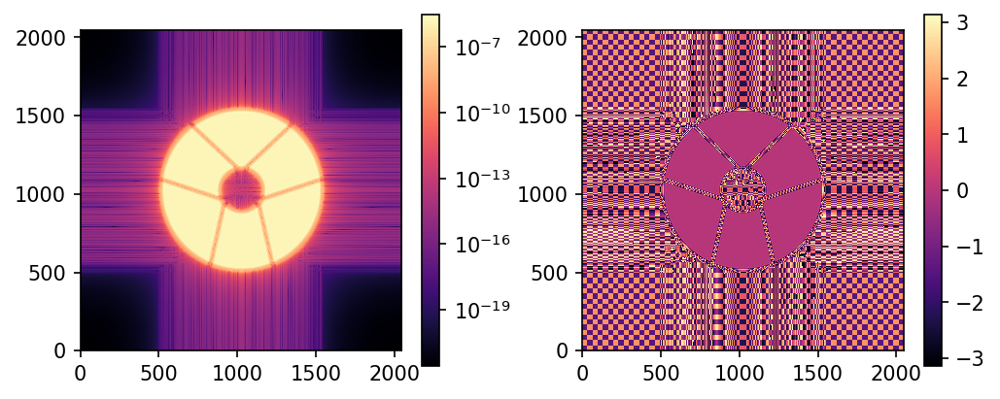

In [85]:
proper.prop_propagate( wavefront, d_fold1_m3, 'M3' )
proper.prop_lens( wavefront, fl_m3 )
if use_errors != 0: proper.prop_errormap( wavefront, map_dir+'wfirst_phaseb_M3_phase_error_V1.0.fits', WAVEFRONT=True )
if use_aperture != 0: proper.prop_circular_aperture( wavefront, diam_m3/2.0 ) 
    
wf_int = np.abs(proper.prop_get_amplitude(wavefront))**2
wf_phase = proper.prop_get_phase(wavefront)
wf_sampling = proper.prop_get_sampling(wavefront)

fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(8,4), dpi=150)
im = ax[0].imshow(wf_int, norm=LogNorm(), cmap=plt.get_cmap('magma'))
fig.colorbar(im, ax=ax[0], shrink=0.8)
im = ax[1].imshow(wf_phase, cmap=plt.get_cmap('magma'))
fig.colorbar(im, ax=ax[1], shrink=0.8)
plt.subplots_adjust(left=None, bottom=None, right=None, top=None, wspace=0.25, hspace=None)

wf = np.zeros(shape=(2,n,n))
wf[0,:,:] = wf_int
wf[1,:,:] = wf_phase

wf_fname = 'wf_m3'
wf_fpath = wf_dir + wf_fname + '_proper' + '.fits'
print(wf_fpath)
hdr = fits.Header()
hdr['PIXELSCL'] = wf_sampling

wf_hdu = fits.PrimaryHDU(wf, header=hdr)
wf_hdu.writeto(wf_fpath, overwrite=True)

# Propagate to M4.

Propagating to M4
Applying lens
/home/u21/kianmilani/Documents/webbpsf-mydev/spc730-fresnel-wavefronts/wf_m4_proper.fits


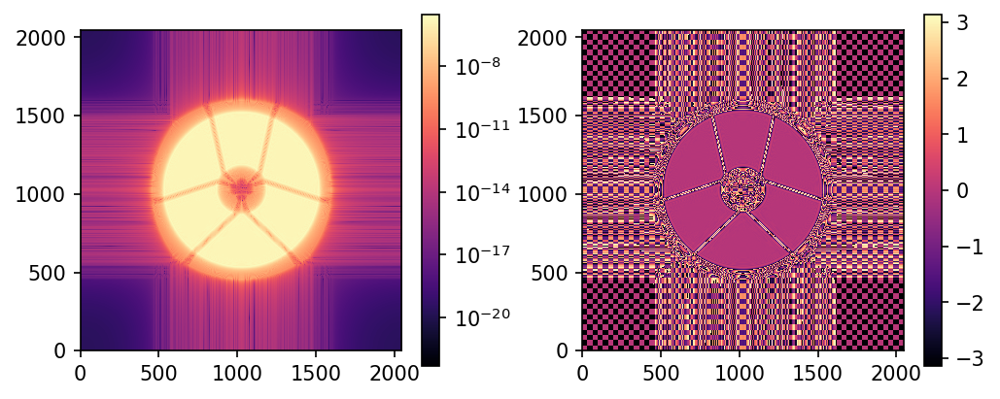

In [86]:
proper.prop_propagate( wavefront, d_m3_m4, 'M4' )
proper.prop_lens( wavefront, fl_m4 )
if use_errors != 0: proper.prop_errormap( wavefront, map_dir+'wfirst_phaseb_M4_phase_error_V1.0.fits', WAVEFRONT=True )
if use_aperture != 0: proper.prop_circular_aperture( wavefront, diam_m4/2.0 ) 
    
wf_int = np.abs(proper.prop_get_amplitude(wavefront))**2
wf_phase = proper.prop_get_phase(wavefront)
wf_sampling = proper.prop_get_sampling(wavefront)

fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(8,4), dpi=150)
im = ax[0].imshow(wf_int, norm=LogNorm(), cmap=plt.get_cmap('magma'))
fig.colorbar(im, ax=ax[0], shrink=0.8)
im = ax[1].imshow(wf_phase, cmap=plt.get_cmap('magma'))
fig.colorbar(im, ax=ax[1], shrink=0.8)
plt.subplots_adjust(left=None, bottom=None, right=None, top=None, wspace=0.25, hspace=None)

wf = np.zeros(shape=(2,n,n))
wf[0,:,:] = wf_int
wf[1,:,:] = wf_phase

wf_fname = 'wf_m4'
wf_fpath = wf_dir + wf_fname + '_proper' + '.fits'
print(wf_fpath)
hdr = fits.Header()
hdr['PIXELSCL'] = wf_sampling

wf_hdu = fits.PrimaryHDU(wf, header=hdr)
wf_hdu.writeto(wf_fpath, overwrite=True)

# Propagate to M5.

Propagating to M5
Applying lens
/home/u21/kianmilani/Documents/webbpsf-mydev/spc730-fresnel-wavefronts/wf_m5_proper.fits


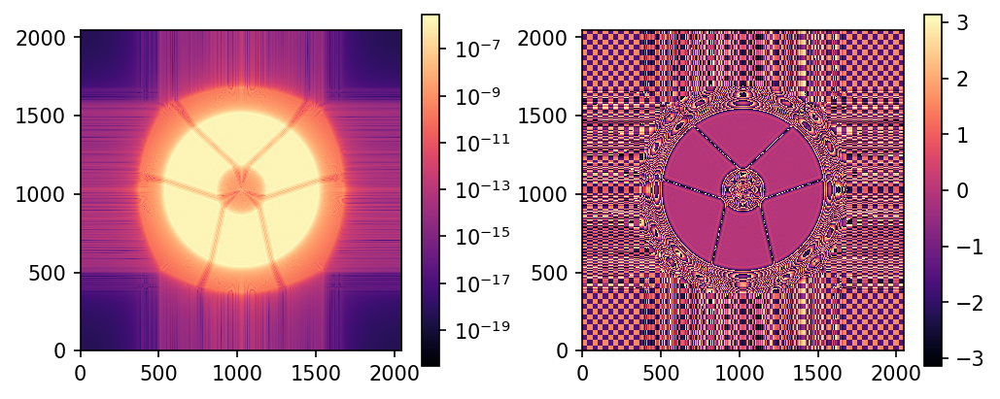

In [87]:
proper.prop_propagate( wavefront, d_m4_m5, 'M5' )
proper.prop_lens( wavefront, fl_m5 )
if use_errors != 0: proper.prop_errormap( wavefront, map_dir+'wfirst_phaseb_M5_phase_error_V1.0.fits', WAVEFRONT=True )
if use_aperture != 0: proper.prop_circular_aperture( wavefront, diam_m5/2.0 ) 
    
wf_int = np.abs(proper.prop_get_amplitude(wavefront))**2
wf_phase = proper.prop_get_phase(wavefront)
wf_sampling = proper.prop_get_sampling(wavefront)

fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(8,4), dpi=150)
im = ax[0].imshow(wf_int, norm=LogNorm(), cmap=plt.get_cmap('magma'))
fig.colorbar(im, ax=ax[0], shrink=0.8)
im = ax[1].imshow(wf_phase, cmap=plt.get_cmap('magma'))
fig.colorbar(im, ax=ax[1], shrink=0.8)
plt.subplots_adjust(left=None, bottom=None, right=None, top=None, wspace=0.25, hspace=None)

wf = np.zeros(shape=(2,n,n))
wf[0,:,:] = wf_int
wf[1,:,:] = wf_phase

wf_fname = 'wf_m5'
wf_fpath = wf_dir + wf_fname + '_proper' + '.fits'
print(wf_fpath)
hdr = fits.Header()
hdr['PIXELSCL'] = wf_sampling

wf_hdu = fits.PrimaryHDU(wf, header=hdr)
wf_hdu.writeto(wf_fpath, overwrite=True)

# Propagate to the second fold mirror.

Propagating to FOLD_2
/home/u21/kianmilani/Documents/webbpsf-mydev/spc730-fresnel-wavefronts/wf_fold2_proper.fits


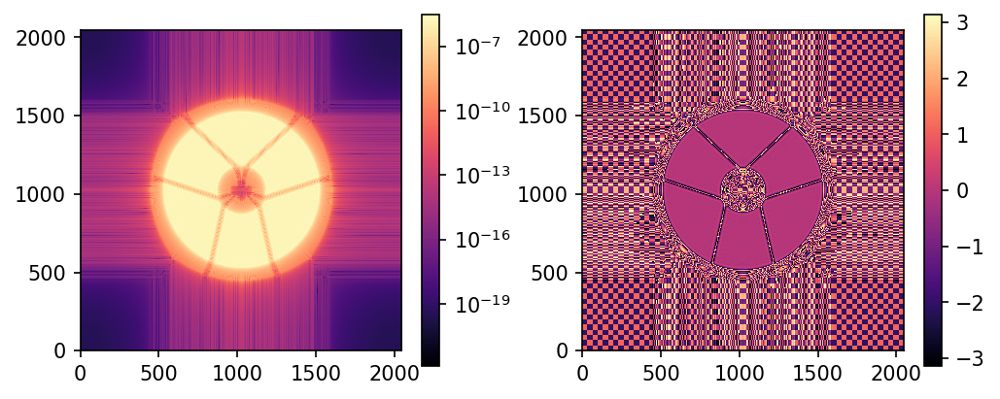

In [88]:
proper.prop_propagate( wavefront, d_m5_fold2, 'FOLD_2' )
if use_errors != 0: proper.prop_errormap( wavefront, map_dir+'wfirst_phaseb_FOLD2_phase_error_V1.0.fits', WAVEFRONT=True )
if use_aperture != 0: proper.prop_circular_aperture( wavefront, diam_fold2/2.0 )
    
wf_int = np.abs(proper.prop_get_amplitude(wavefront))**2
wf_phase = proper.prop_get_phase(wavefront)
wf_sampling = proper.prop_get_sampling(wavefront)

fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(8,4), dpi=150)
im = ax[0].imshow(wf_int, norm=LogNorm(), cmap=plt.get_cmap('magma'))
fig.colorbar(im, ax=ax[0], shrink=0.8)
im = ax[1].imshow(wf_phase, cmap=plt.get_cmap('magma'))
fig.colorbar(im, ax=ax[1], shrink=0.8)
plt.subplots_adjust(left=None, bottom=None, right=None, top=None, wspace=0.25, hspace=None)

wf = np.zeros(shape=(2,n,n))
wf[0,:,:] = wf_int
wf[1,:,:] = wf_phase

wf_fname = 'wf_fold2'
wf_fpath = wf_dir + wf_fname + '_proper' + '.fits'
print(wf_fpath)
hdr = fits.Header()
hdr['PIXELSCL'] = wf_sampling

wf_hdu = fits.PrimaryHDU(wf, header=hdr)
wf_hdu.writeto(wf_fpath, overwrite=True)

# Propagate to FSM.

Propagating to FSM
/home/u21/kianmilani/Documents/webbpsf-mydev/spc730-fresnel-wavefronts/wf_fsm_proper.fits


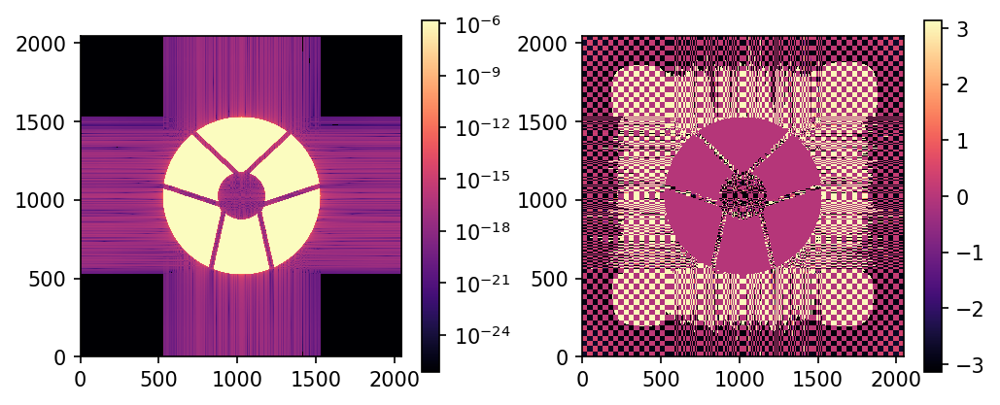

In [89]:
proper.prop_propagate( wavefront, d_fold2_fsm, 'FSM' )
# if end_at_fsm == 1:
#     (wavefront, sampling_m) = proper.prop_end( wavefront, NOABS=True )
#     wavefront = trim(wavefront, n)
#     return wavefront, sampling_m
if cgi_x_shift_pupdiam != 0 or cgi_y_shift_pupdiam != 0 or cgi_x_shift_m != 0 or cgi_y_shift_m != 0:    # bulk coronagraph pupil shear
    # FFT the field, apply a tilt, FFT back
    if cgi_x_shift_pupdiam != 0 or cgi_y_shift_pupdiam != 0:
        # offsets are normalized to pupil diameter
        xt = -cgi_x_shift_pupdiam * pupil_diam_pix * float(pupil_diam_pix)/n 
        yt = -cgi_y_shift_pupdiam * pupil_diam_pix * float(pupil_diam_pix)/n
    else:
        # offsets are meters
        d_m = proper.prop_get_sampling(wavefront) 
        xt = -cgi_x_shift_m / d_m * float(pupil_diam_pix)/n 
        yt = -cgi_y_shift_m / d_m * float(pupil_diam_pix)/n 
    x = np.tile( (np.arange(n)-n//2) / (pupil_diam_pix/2.0), (n,1) )
    y = np.transpose(x)
    tilt = complex(0,1) * np.pi * (x*xt + y*yt)
    x = 0
    y = 0
    wavefront0 = proper.prop_get_wavefront(wavefront)
    wavefront0 = ffts( wavefront0, -1 )
    wavefront0 *= np.exp(tilt)
    wavefront0 = ffts( wavefront0, 1 )
    tilt = 0
    wavefront.wfarr[:,:] = proper.prop_shift_center(wavefront0)
    wavefront0 = 0
if use_errors != 0: proper.prop_errormap( wavefront, map_dir+'wfirst_phaseb_FSM_phase_error_V1.0.fits', WAVEFRONT=True )
if use_aperture != 0: proper.prop_circular_aperture( wavefront, diam_fsm/2.0 )
if ( fsm_x_offset != 0.0 or fsm_y_offset != 0.0 ):
    # compute tilted wavefront to offset source by fsm_x_offset,fsm_y_offset lambda0_m/D
    xtilt_lam = fsm_x_offset * lambda0_m / lambda_m
    ytilt_lam = fsm_y_offset * lambda0_m / lambda_m
    x = np.tile( (np.arange(n)-n//2) / (pupil_diam_pix/2.0), (n,1) )
    y = np.transpose(x)
    proper.prop_multiply( wavefront, np.exp(complex(0,1) * np.pi * (xtilt_lam * x + ytilt_lam * y)) )
    x = 0
    y = 0
    
wf_int = np.abs(proper.prop_get_amplitude(wavefront))**2
wf_phase = proper.prop_get_phase(wavefront)
wf_sampling = proper.prop_get_sampling(wavefront)

fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(8,4), dpi=150)
im = ax[0].imshow(wf_int, norm=LogNorm(), cmap=plt.get_cmap('magma'))
fig.colorbar(im, ax=ax[0], shrink=0.8)
im = ax[1].imshow(wf_phase, cmap=plt.get_cmap('magma'))
fig.colorbar(im, ax=ax[1], shrink=0.8)
plt.subplots_adjust(left=None, bottom=None, right=None, top=None, wspace=0.25, hspace=None)

wf = np.zeros(shape=(2,n,n))
wf[0,:,:] = wf_int
wf[1,:,:] = wf_phase

wf_fname = 'wf_fsm'
wf_fpath = wf_dir + wf_fname + '_proper' + '.fits'
print(wf_fpath)
hdr = fits.Header()
hdr['PIXELSCL'] = wf_sampling

wf_hdu = fits.PrimaryHDU(wf, header=hdr)
wf_hdu.writeto(wf_fpath, overwrite=True)

# Propagate to OAP1.

Propagating to OAP1
Applying lens
/home/u21/kianmilani/Documents/webbpsf-mydev/spc730-fresnel-wavefronts/wf_oap1_proper.fits


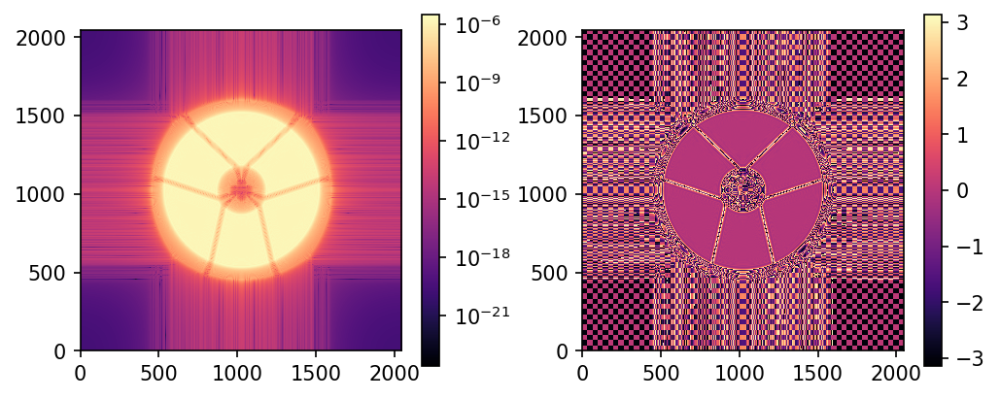

In [90]:
proper.prop_propagate( wavefront, d_fsm_oap1, 'OAP1' )
proper.prop_lens( wavefront, fl_oap1 )
if use_errors != 0: proper.prop_errormap( wavefront, map_dir+'wfirst_phaseb_OAP1_phase_error_V1.0.fits', WAVEFRONT=True )
if use_aperture != 0: proper.prop_circular_aperture( wavefront, diam_oap1/2.0 )  
    
wf_int = np.abs(proper.prop_get_amplitude(wavefront))**2
wf_phase = proper.prop_get_phase(wavefront)
wf_sampling = proper.prop_get_sampling(wavefront)

fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(8,4), dpi=150)
im = ax[0].imshow(wf_int, norm=LogNorm(), cmap=plt.get_cmap('magma'))
fig.colorbar(im, ax=ax[0], shrink=0.8)
im = ax[1].imshow(wf_phase, cmap=plt.get_cmap('magma'))
fig.colorbar(im, ax=ax[1], shrink=0.8)
plt.subplots_adjust(left=None, bottom=None, right=None, top=None, wspace=0.25, hspace=None)

wf = np.zeros(shape=(2,n,n))
wf[0,:,:] = wf_int
wf[1,:,:] = wf_phase

wf_fname = 'wf_oap1'
wf_fpath = wf_dir + wf_fname + '_proper' + '.fits'
print(wf_fpath)
hdr = fits.Header()
hdr['PIXELSCL'] = wf_sampling

wf_hdu = fits.PrimaryHDU(wf, header=hdr)
wf_hdu.writeto(wf_fpath, overwrite=True)

# Propagate to FOCM.

Propagating to FOCM
/home/u21/kianmilani/Documents/webbpsf-mydev/spc730-fresnel-wavefronts/wf_focm_proper.fits


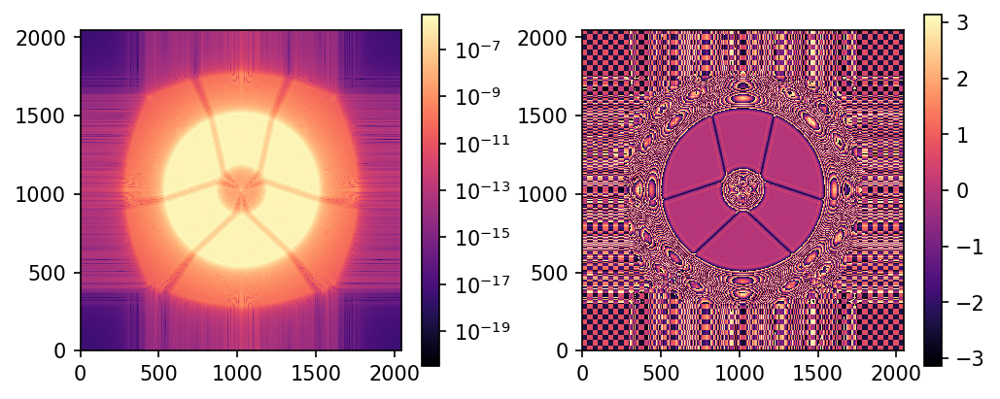

In [91]:
proper.prop_propagate( wavefront, d_oap1_focm+focm_z_shift_m, 'FOCM' )
if use_errors != 0: proper.prop_errormap( wavefront, map_dir+'wfirst_phaseb_FOCM_phase_error_V1.0.fits', WAVEFRONT=True )
if use_aperture != 0: proper.prop_circular_aperture( wavefront, diam_focm/2.0 )
    
wf_int = np.abs(proper.prop_get_amplitude(wavefront))**2
wf_phase = proper.prop_get_phase(wavefront)
wf_sampling = proper.prop_get_sampling(wavefront)

fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(8,4), dpi=150)
im = ax[0].imshow(wf_int, norm=LogNorm(), cmap=plt.get_cmap('magma'))
fig.colorbar(im, ax=ax[0], shrink=0.8)
im = ax[1].imshow(wf_phase, cmap=plt.get_cmap('magma'))
fig.colorbar(im, ax=ax[1], shrink=0.8)
plt.subplots_adjust(left=None, bottom=None, right=None, top=None, wspace=0.25, hspace=None)

wf = np.zeros(shape=(2,n,n))
wf[0,:,:] = wf_int
wf[1,:,:] = wf_phase

wf_fname = 'wf_focm'
wf_fpath = wf_dir + wf_fname + '_proper' + '.fits'
print(wf_fpath)
hdr = fits.Header()
hdr['PIXELSCL'] = wf_sampling

wf_hdu = fits.PrimaryHDU(wf, header=hdr)
wf_hdu.writeto(wf_fpath, overwrite=True)

# Propagate to OAP2.

Propagating to OAP2
Applying lens
/home/u21/kianmilani/Documents/webbpsf-mydev/spc730-fresnel-wavefronts/wf_oap2_proper.fits


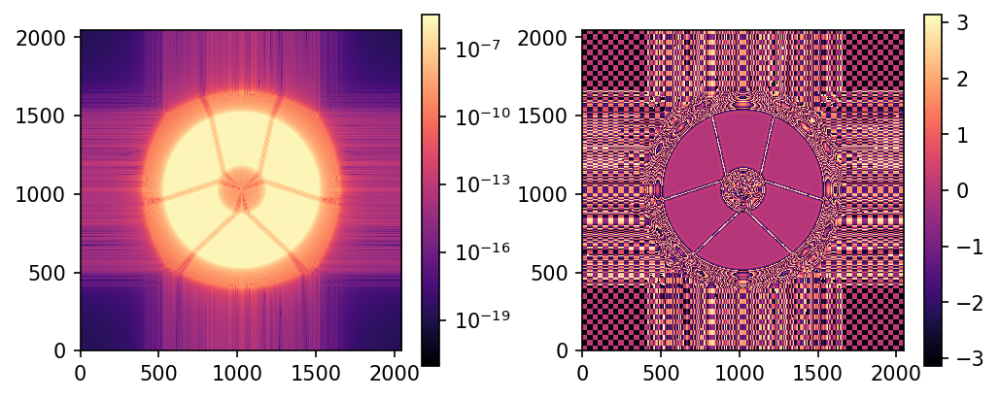

In [92]:
proper.prop_propagate( wavefront, d_focm_oap2+focm_z_shift_m, 'OAP2' )
proper.prop_lens( wavefront, fl_oap2 )
if use_errors != 0: proper.prop_errormap( wavefront, map_dir+'wfirst_phaseb_OAP2_phase_error_V1.0.fits', WAVEFRONT=True )
if use_aperture != 0: proper.prop_circular_aperture( wavefront, diam_oap2/2.0 )  
    
wf_int = np.abs(proper.prop_get_amplitude(wavefront))**2
wf_phase = proper.prop_get_phase(wavefront)
wf_sampling = proper.prop_get_sampling(wavefront)

fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(8,4), dpi=150)
im = ax[0].imshow(wf_int, norm=LogNorm(), cmap=plt.get_cmap('magma'))
fig.colorbar(im, ax=ax[0], shrink=0.8)
im = ax[1].imshow(wf_phase, cmap=plt.get_cmap('magma'))
fig.colorbar(im, ax=ax[1], shrink=0.8)
plt.subplots_adjust(left=None, bottom=None, right=None, top=None, wspace=0.25, hspace=None)

wf = np.zeros(shape=(2,n,n))
wf[0,:,:] = wf_int
wf[1,:,:] = wf_phase

wf_fname = 'wf_oap2'
wf_fpath = wf_dir + wf_fname + '_proper' + '.fits'
print(wf_fpath)
hdr = fits.Header()
hdr['PIXELSCL'] = wf_sampling

wf_hdu = fits.PrimaryHDU(wf, header=hdr)
wf_hdu.writeto(wf_fpath, overwrite=True)

# Propagate to DM1.

Propagating to DM1
/home/u21/kianmilani/Documents/webbpsf-mydev/spc730-fresnel-wavefronts/wf_dm1_proper.fits


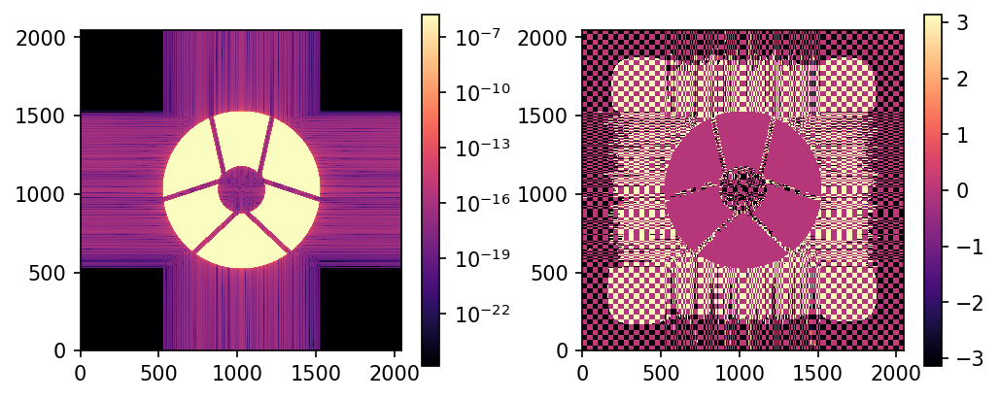

In [93]:
proper.prop_propagate( wavefront, d_oap2_dm1, 'DM1' )
if use_dm1 != 0: proper.prop_dm( wavefront, dm1_m, dm1_xc_act, dm1_yc_act, dm_sampling_m, XTILT=dm1_xtilt_deg, YTILT=dm1_ytilt_deg, ZTILT=dm1_ztilt_deg )
if use_errors != 0: proper.prop_errormap( wavefront, map_dir+'wfirst_phaseb_DM1_phase_error_V1.0.fits', WAVEFRONT=True )
    
wf_int = np.abs(proper.prop_get_amplitude(wavefront))**2
wf_phase = proper.prop_get_phase(wavefront)
wf_sampling = proper.prop_get_sampling(wavefront)

fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(8,4), dpi=150)
im = ax[0].imshow(wf_int, norm=LogNorm(), cmap=plt.get_cmap('magma'))
fig.colorbar(im, ax=ax[0], shrink=0.8)
im = ax[1].imshow(wf_phase, cmap=plt.get_cmap('magma'))
fig.colorbar(im, ax=ax[1], shrink=0.8)
plt.subplots_adjust(left=None, bottom=None, right=None, top=None, wspace=0.25, hspace=None)

wf = np.zeros(shape=(2,n,n))
wf[0,:,:] = wf_int
wf[1,:,:] = wf_phase

wf_fname = 'wf_dm1'
wf_fpath = wf_dir + wf_fname + '_proper' + '.fits'
print(wf_fpath)
hdr = fits.Header()
hdr['PIXELSCL'] = wf_sampling

wf_hdu = fits.PrimaryHDU(wf, header=hdr)
wf_hdu.writeto(wf_fpath, overwrite=True)

# Propagate to DM2.

Propagating to DM2
/home/u21/kianmilani/Documents/webbpsf-mydev/spc730-fresnel-wavefronts/wf_dm2_proper.fits


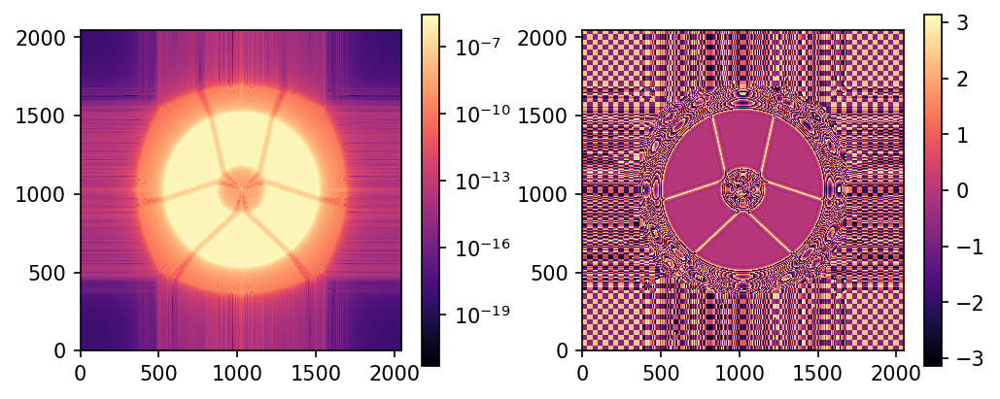

In [94]:
proper.prop_propagate( wavefront, d_dm1_dm2, 'DM2' )
if use_dm2 == 1: proper.prop_dm( wavefront, dm2_m, dm2_xc_act, dm2_yc_act, dm_sampling_m, XTILT=dm2_xtilt_deg, YTILT=dm2_ytilt_deg, ZTILT=dm2_ztilt_deg )
if use_errors != 0: proper.prop_errormap( wavefront, map_dir+'wfirst_phaseb_DM2_phase_error_V1.0.fits', WAVEFRONT=True )
    
wf_int = np.abs(proper.prop_get_amplitude(wavefront))**2
wf_phase = proper.prop_get_phase(wavefront)
wf_sampling = proper.prop_get_sampling(wavefront)

fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(8,4), dpi=150)
im = ax[0].imshow(wf_int, norm=LogNorm(), cmap=plt.get_cmap('magma'))
fig.colorbar(im, ax=ax[0], shrink=0.8)
im = ax[1].imshow(wf_phase, cmap=plt.get_cmap('magma'))
fig.colorbar(im, ax=ax[1], shrink=0.8)
plt.subplots_adjust(left=None, bottom=None, right=None, top=None, wspace=0.25, hspace=None)

wf = np.zeros(shape=(2,n,n))
wf[0,:,:] = wf_int
wf[1,:,:] = wf_phase

wf_fname = 'wf_dm2'
wf_fpath = wf_dir + wf_fname + '_proper' + '.fits'
print(wf_fpath)
hdr = fits.Header()
hdr['PIXELSCL'] = wf_sampling

wf_hdu = fits.PrimaryHDU(wf, header=hdr)
wf_hdu.writeto(wf_fpath, overwrite=True)

# Propagate to OAP3.

Propagating to OAP3
Applying lens
/home/u21/kianmilani/Documents/webbpsf-mydev/spc730-fresnel-wavefronts/wf_oap3_proper.fits


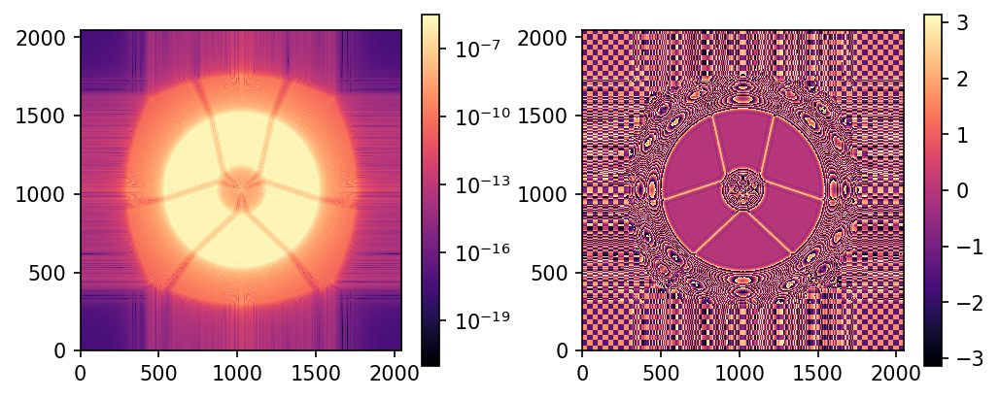

In [95]:
proper.prop_propagate( wavefront, d_dm2_oap3, 'OAP3' )
proper.prop_lens( wavefront, fl_oap3 )
if use_errors != 0: proper.prop_errormap( wavefront, map_dir+'wfirst_phaseb_OAP3_phase_error_V1.0.fits', WAVEFRONT=True )
if use_aperture != 0: proper.prop_circular_aperture( wavefront, diam_oap3/2.0 ) 
    
wf_int = np.abs(proper.prop_get_amplitude(wavefront))**2
wf_phase = proper.prop_get_phase(wavefront)
wf_sampling = proper.prop_get_sampling(wavefront)

fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(8,4), dpi=150)
im = ax[0].imshow(wf_int, norm=LogNorm(), cmap=plt.get_cmap('magma'))
fig.colorbar(im, ax=ax[0], shrink=0.8)
im = ax[1].imshow(wf_phase, cmap=plt.get_cmap('magma'))
fig.colorbar(im, ax=ax[1], shrink=0.8)
plt.subplots_adjust(left=None, bottom=None, right=None, top=None, wspace=0.25, hspace=None)

wf = np.zeros(shape=(2,n,n))
wf[0,:,:] = wf_int
wf[1,:,:] = wf_phase

wf_fname = 'wf_oap3'
wf_fpath = wf_dir + wf_fname + '_proper' + '.fits'
print(wf_fpath)
hdr = fits.Header()
hdr['PIXELSCL'] = wf_sampling

wf_hdu = fits.PrimaryHDU(wf, header=hdr)
wf_hdu.writeto(wf_fpath, overwrite=True)

# Propagate to the third fold mirror.

Propagating to FOLD_3
/home/u21/kianmilani/Documents/webbpsf-mydev/spc730-fresnel-wavefronts/wf_fold3_proper.fits


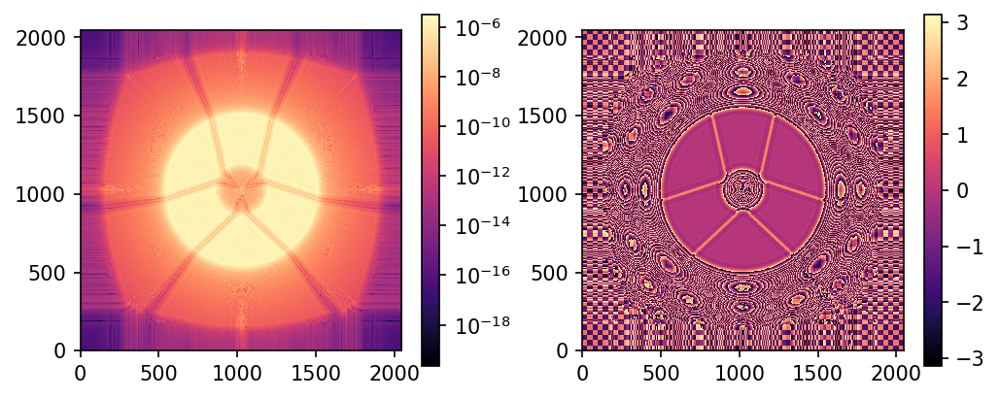

In [96]:
proper.prop_propagate( wavefront, d_oap3_fold3, 'FOLD_3' )
if use_errors != 0: proper.prop_errormap( wavefront, map_dir+'wfirst_phaseb_FOLD3_phase_error_V1.0.fits', WAVEFRONT=True )
if use_aperture != 0: proper.prop_circular_aperture( wavefront, diam_fold3/2.0 )
    
wf_int = np.abs(proper.prop_get_amplitude(wavefront))**2
wf_phase = proper.prop_get_phase(wavefront)
wf_sampling = proper.prop_get_sampling(wavefront)

fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(8,4), dpi=150)
im = ax[0].imshow(wf_int, norm=LogNorm(), cmap=plt.get_cmap('magma'))
fig.colorbar(im, ax=ax[0], shrink=0.8)
im = ax[1].imshow(wf_phase, cmap=plt.get_cmap('magma'))
fig.colorbar(im, ax=ax[1], shrink=0.8)
plt.subplots_adjust(left=None, bottom=None, right=None, top=None, wspace=0.25, hspace=None)

wf = np.zeros(shape=(2,n,n))
wf[0,:,:] = wf_int
wf[1,:,:] = wf_phase

wf_fname = 'wf_fold3'
wf_fpath = wf_dir + wf_fname + '_proper' + '.fits'
print(wf_fpath)
hdr = fits.Header()
hdr['PIXELSCL'] = wf_sampling

wf_hdu = fits.PrimaryHDU(wf, header=hdr)
wf_hdu.writeto(wf_fpath, overwrite=True)

# Propagate to OAP4.

Propagating to OAP4
Applying lens
/home/u21/kianmilani/Documents/webbpsf-mydev/spc730-fresnel-wavefronts/wf_oap4_proper.fits


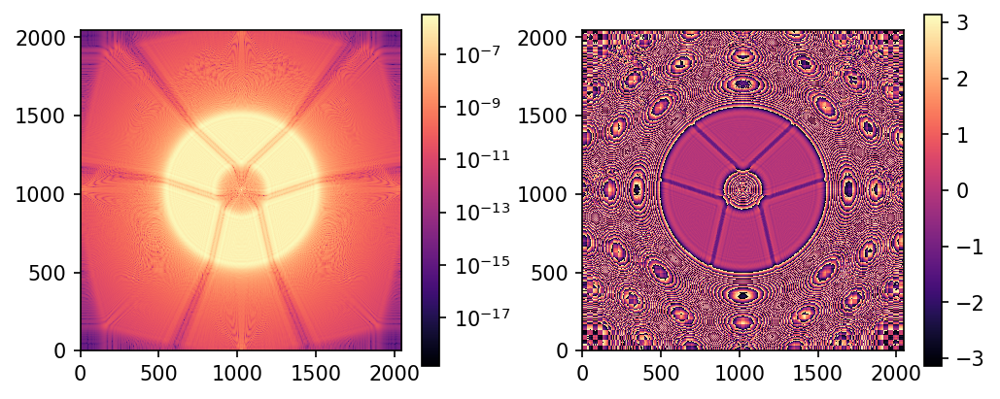

In [97]:
proper.prop_propagate( wavefront, d_fold3_oap4, 'OAP4' )
proper.prop_lens( wavefront, fl_oap4 )
if use_errors != 0: proper.prop_errormap( wavefront, map_dir+'wfirst_phaseb_OAP4_phase_error_V1.0.fits', WAVEFRONT=True )
if use_aperture != 0: proper.prop_circular_aperture( wavefront, diam_oap4/2.0 )
    
wf_int = np.abs(proper.prop_get_amplitude(wavefront))**2
wf_phase = proper.prop_get_phase(wavefront)
wf_sampling = proper.prop_get_sampling(wavefront)

fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(8,4), dpi=150)
im = ax[0].imshow(wf_int, norm=LogNorm(), cmap=plt.get_cmap('magma'))
fig.colorbar(im, ax=ax[0], shrink=0.8)
im = ax[1].imshow(wf_phase, cmap=plt.get_cmap('magma'))
fig.colorbar(im, ax=ax[1], shrink=0.8)
plt.subplots_adjust(left=None, bottom=None, right=None, top=None, wspace=0.25, hspace=None)

wf = np.zeros(shape=(2,n,n))
wf[0,:,:] = wf_int
wf[1,:,:] = wf_phase

wf_fname = 'wf_oap4'
wf_fpath = wf_dir + wf_fname + '_proper' + '.fits'
print(wf_fpath)
hdr = fits.Header()
hdr['PIXELSCL'] = wf_sampling

wf_hdu = fits.PrimaryHDU(wf, header=hdr)
wf_hdu.writeto(wf_fpath, overwrite=True)

# Propagate to Pupil Mask Plane.

Propagating to PUPIL_MASK
/home/u21/kianmilani/Documents/webbpsf-mydev/spc730-fresnel-wavefronts/wf_spm_proper.fits


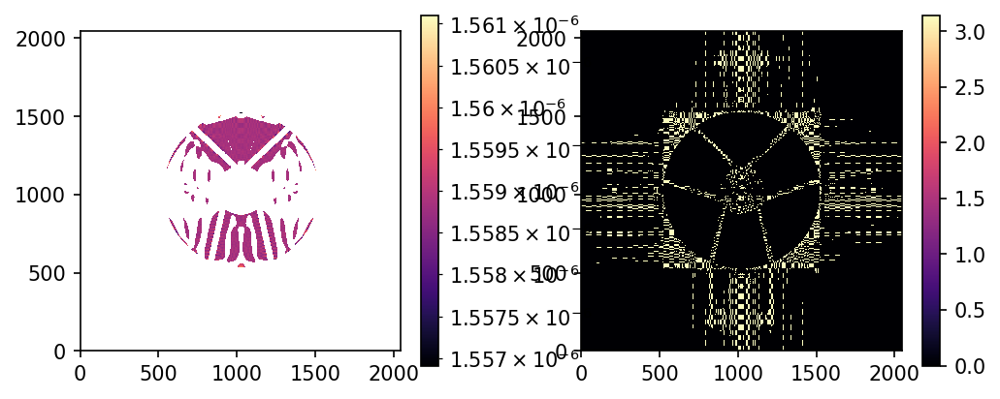

In [98]:
proper.prop_propagate( wavefront, d_oap4_pupilmask, 'PUPIL_MASK' )    # flat/reflective shaped pupil
if is_spc == True and use_pupil_mask != 0:
    pupil_mask = proper.prop_fits_read( pupil_mask_file )
    pupil_mask = trim( pupil_mask, n )
    if mask_x_shift_pupdiam != 0 or mask_y_shift_pupdiam != 0 or mask_x_shift_m != 0 or mask_y_shift_m != 0:
        # shift SP mask by FFTing it, applying tilt, and FFTing back 
        if mask_x_shift_pupdiam != 0 or mask_y_shift_pupdiam != 0:
            # offsets are normalized to pupil diameter
            xt = -mask_x_shift_pupdiam * pupil_diam_pix * float(pupil_diam_pix)/n
            yt = -mask_y_shift_pupdiam * pupil_diam_pix * float(pupil_diam_pix)/n
        else:
            d_m = proper.prop_get_sampling(wavefront)
            xt = -mask_x_shift_m / d_m * float(pupil_diam_pix)/n
            yt = -mask_y_shift_m / d_m * float(pupil_diam_pix)/n
        x = np.tile( (np.arange(n)-n//2) / (pupil_diam_pix/2.0), (n,1) )
        y = np.transpose(x)
        tilt = complex(0,1) * np.pi * (x*xt + y*yt)
        x = 0
        y = 0
        pupil_mask = ffts( pupil_mask, -1 )
        pupil_mask *= np.exp(tilt)
        pupil_mask = ffts( pupil_mask, 1 )
        pupil_mask = pupil_mask.real
        tilt = 0
    proper.prop_multiply( wavefront, pupil_mask )
    pupil_mask = 0
if use_errors != 0: proper.prop_errormap( wavefront, map_dir+'wfirst_phaseb_PUPILMASK_phase_error_V1.0.fits', WAVEFRONT=True )
# while at a pupil, use more padding to provide 2x better sampling at FPM
diam = 2 * proper.prop_get_beamradius(wavefront)
(wavefront, dx) = proper.prop_end( wavefront, NOABS=True )
n = n_to_fpm
wavefront0 = trim(wavefront,n)
wavefront = proper.prop_begin( diam, lambda_m, n, float(pupil_diam_pix)/n )
wavefront.wfarr[:,:] = proper.prop_shift_center(wavefront0)
wavefront0 = 0

wf_int = np.abs(proper.prop_get_amplitude(wavefront))**2
wf_phase = proper.prop_get_phase(wavefront)
wf_sampling = proper.prop_get_sampling(wavefront)

fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(8,4), dpi=150)
im = ax[0].imshow(wf_int, norm=LogNorm(), cmap=plt.get_cmap('magma'))
fig.colorbar(im, ax=ax[0], shrink=0.8)
im = ax[1].imshow(wf_phase, cmap=plt.get_cmap('magma'))
fig.colorbar(im, ax=ax[1], shrink=0.8)
plt.subplots_adjust(left=None, bottom=None, right=None, top=None, wspace=0.25, hspace=None)

wf = np.zeros(shape=(2,n,n))
wf[0,:,:] = wf_int
wf[1,:,:] = wf_phase

wf_fname = 'wf_spm'
wf_fpath = wf_dir + wf_fname + '_proper' + '.fits'
print(wf_fpath)
hdr = fits.Header()
hdr['PIXELSCL'] = wf_sampling

wf_hdu = fits.PrimaryHDU(wf, header=hdr)
wf_hdu.writeto(wf_fpath, overwrite=True)

# Propagate to OAP5.

Propagating to OAP5
Applying lens
/home/u21/kianmilani/Documents/webbpsf-mydev/spc730-fresnel-wavefronts/wf_oap5_proper.fits


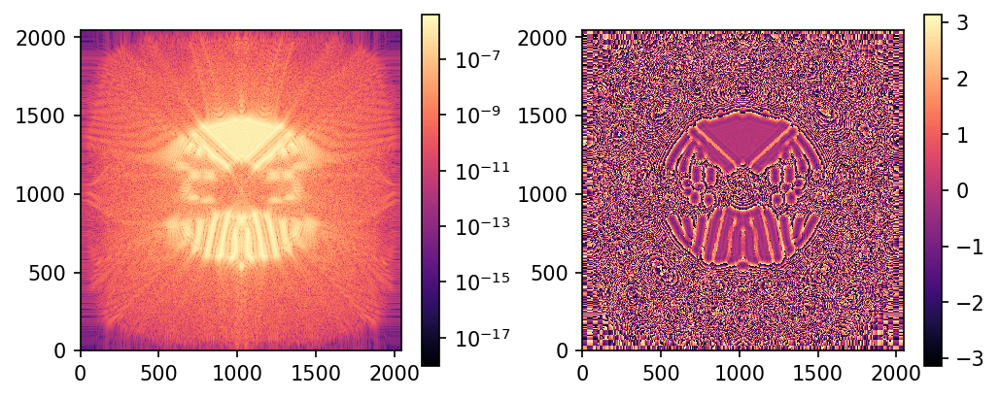

In [99]:
proper.prop_propagate( wavefront, d_pupilmask_oap5, 'OAP5' )
proper.prop_lens( wavefront, fl_oap5 )
if use_errors != 0: proper.prop_errormap( wavefront, map_dir+'wfirst_phaseb_OAP5_phase_error_V1.0.fits', WAVEFRONT=True )
if use_aperture != 0: proper.prop_circular_aperture( wavefront, diam_oap5/2.0 )  
    
wf_int = np.abs(proper.prop_get_amplitude(wavefront))**2
wf_phase = proper.prop_get_phase(wavefront)
wf_sampling = proper.prop_get_sampling(wavefront)

fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(8,4), dpi=150)
im = ax[0].imshow(wf_int, norm=LogNorm(), cmap=plt.get_cmap('magma'))
fig.colorbar(im, ax=ax[0], shrink=0.8)
im = ax[1].imshow(wf_phase, cmap=plt.get_cmap('magma'))
fig.colorbar(im, ax=ax[1], shrink=0.8)
plt.subplots_adjust(left=None, bottom=None, right=None, top=None, wspace=0.25, hspace=None)

wf = np.zeros(shape=(2,n,n))
wf[0,:,:] = wf_int
wf[1,:,:] = wf_phase

wf_fname = 'wf_oap5'
wf_fpath = wf_dir + wf_fname + '_proper' + '.fits'
print(wf_fpath)
hdr = fits.Header()
hdr['PIXELSCL'] = wf_sampling

wf_hdu = fits.PrimaryHDU(wf, header=hdr)
wf_hdu.writeto(wf_fpath, overwrite=True)

# Propagate to FPM.

Propagating to FPM
(361, 361) [[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]
/home/u21/kianmilani/Documents/webbpsf-mydev/spc730-fresnel-wavefronts/wf_fpm_proper.fits


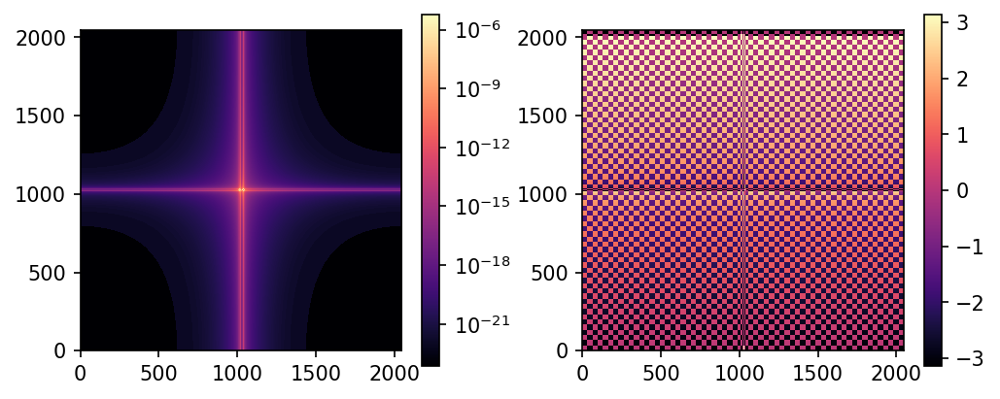

In [100]:
proper.prop_propagate( wavefront, d_oap5_fpm+fpm_z_shift_m, 'FPM', TO_PLANE=True )
use_fpm=1
if use_fpm == 1:
    if fpm_x_offset != 0 or fpm_y_offset != 0 or fpm_x_offset_m != 0 or fpm_y_offset_m != 0:
        # To shift FPM, FFT field to pupil, apply tilt, FFT back to focus, 
        # apply FPM, FFT to pupil, take out tilt, FFT back to focus 
        if fpm_x_offset != 0 or fpm_y_offset != 0:
            # shifts are specified in lambda0/D
            x_offset_lamD = fpm_x_offset * lambda0_m / lambda_m
            y_offset_lamD = fpm_y_offset * lambda0_m / lambda_m
        else:
            d_m = proper.prop_get_sampling(wavefront)
            x_offset_lamD = fpm_x_offset_m / d_m * float(pupil_diam_pix)/n
            y_offset_lamD = fpm_y_offset_m / d_m * float(pupil_diam_pix)/n
        x = np.tile( (np.arange(n)-n//2) / (pupil_diam_pix/2.0), (n,1) )
        y = np.transpose(x)
        tilt = complex(0,1) * np.pi * (x*x_offset_lamD + y*y_offset_lamD)
        x = 0
        y = 0
        wavefront0 = proper.prop_get_wavefront(wavefront)
        wavefront0 = ffts( wavefront0, -1 )
        wavefront0 *= np.exp(tilt)
        wavefront0 = ffts( wavefront0, 1 )
        wavefront.wfarr[:,:] = proper.prop_shift_center(wavefront0)
        wavefront0 = 0
    elif is_spc == True:
        # super-sample FPM
        wavefront0 = proper.prop_get_wavefront(wavefront)
        wavefront0 = ffts( wavefront0, 1 )                # to virtual pupil
        wavefront0 = trim(wavefront0, n_mft)
        fpm = proper.prop_fits_read( fpm_file ); print(fpm.shape, fpm)
        nfpm = fpm.shape[1]
        fpm_sampling_lam = fpm_sampling * fpm_sampling_lambda_m / lambda_m
        wavefront0 = mft2(wavefront0, fpm_sampling_lam, pupil_diam_pix, nfpm, -1)   # MFT to highly-sampled focal plane
        wavefront0 *= fpm
        fpm = 0
        wavefront0 = mft2(wavefront0, fpm_sampling_lam, pupil_diam_pix, n, +1)  # MFT to virtual pupil 
        wavefront0 = ffts( wavefront0, -1 )    # back to normally-sampled focal plane
        wavefront.wfarr[:,:] = proper.prop_shift_center(wavefront0)
        wavefront0 = 0
    if fpm_x_offset != 0 or fpm_y_offset != 0 or fpm_x_offset_m != 0 or fpm_y_offset_m != 0:
        wavefront0 = proper.prop_get_wavefront(wavefront)
        wavefront0 = ffts( wavefront0, -1 )
        wavefront0 *= np.exp(-tilt)
        wavefront0 = ffts( wavefront0, 1 )
        wavefront.wfarr[:,:] = proper.prop_shift_center(wavefront0)
        wavefront0 = 0
        tilt = 0
if pinhole_diam_m != 0:
    # "pinhole_diam_m" is pinhole diameter in meters
    dx_m = proper.prop_get_sampling(wavefront)
    dx_pinhole_diam_m = pinhole_diam_m / 101.0        # 101 samples across pinhole
    n_out = 105
    m_per_lamD = dx_m * n / float(pupil_diam_pix)        # current focal plane sampling in lambda_m/D
    dx_pinhole_lamD = dx_pinhole_diam_m / m_per_lamD    # pinhole sampling in lambda_m/D
    n_in = int(round(pupil_diam_pix * 1.2))
    wavefront0 = proper.prop_get_wavefront(wavefront)
    wavefront0 = ffts( wavefront0, +1 )            # to virtual pupil
    wavefront0 = trim(wavefront0, n_in)
    m = dx_pinhole_lamD * n_in * float(n_out) / pupil_diam_pix
    wavefront0 = mft2( wavefront0, dx_pinhole_lamD, pupil_diam_pix, n_out, -1)        # MFT to highly-sampled focal plane
    p = (radius(n_out)*dx_pinhole_diam_m) <= (pinhole_diam_m/2.0)
    p = p.astype(np.int)
    wavefront0 *= p
    p = 0
    wavefront0 = mft2( wavefront0, dx_pinhole_lamD, pupil_diam_pix, n, +1)            # MFT back to virtual pupil
    wavefront0 = ffts( wavefront0, -1 )            # back to normally-sampled focal plane
    wavefront.wfarr[:,:] = proper.prop_shift_center(wavefront0)
    wavefront0 = 0
    
wf_int = np.abs(proper.prop_get_amplitude(wavefront))**2
wf_phase = proper.prop_get_phase(wavefront)
wf_sampling = proper.prop_get_sampling(wavefront)

fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(8,4), dpi=150)
im = ax[0].imshow(wf_int, norm=LogNorm(), cmap=plt.get_cmap('magma'))
fig.colorbar(im, ax=ax[0], shrink=0.8)
im = ax[1].imshow(wf_phase, cmap=plt.get_cmap('magma'))
fig.colorbar(im, ax=ax[1], shrink=0.8)
plt.subplots_adjust(left=None, bottom=None, right=None, top=None, wspace=0.25, hspace=None)

wf = np.zeros(shape=(2,n,n))
wf[0,:,:] = wf_int
wf[1,:,:] = wf_phase

wf_fname = 'wf_fpm'
wf_fpath = wf_dir + wf_fname + '_proper' + '.fits'
print(wf_fpath)
hdr = fits.Header()
hdr['PIXELSCL'] = wf_sampling

wf_hdu = fits.PrimaryHDU(wf, header=hdr)
wf_hdu.writeto(wf_fpath, overwrite=True)

# Propagate to OAP6.

Propagating to OAP6
Applying lens
/home/u21/kianmilani/Documents/webbpsf-mydev/spc730-fresnel-wavefronts/wf_oap6_proper.fits


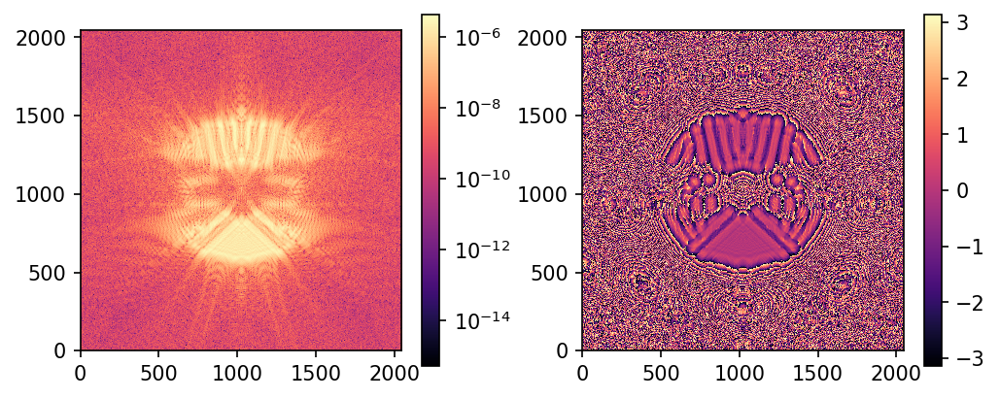

In [35]:
proper.prop_propagate( wavefront, d_fpm_oap6-fpm_z_shift_m, 'OAP6' )
proper.prop_lens( wavefront, fl_oap6 )
if use_errors != 0 and end_at_fpm_exit_pupil == 0: proper.prop_errormap( wavefront, map_dir+'wfirst_phaseb_OAP6_phase_error_V1.0.fits', WAVEFRONT=True )
if use_aperture != 0: proper.prop_circular_aperture( wavefront, diam_oap6/2.0 )  
    
wf_int = np.abs(proper.prop_get_amplitude(wavefront))**2
wf_phase = proper.prop_get_phase(wavefront)
wf_sampling = proper.prop_get_sampling(wavefront)

fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(8,4), dpi=150)
im = ax[0].imshow(wf_int, norm=LogNorm(), cmap=plt.get_cmap('magma'))
fig.colorbar(im, ax=ax[0], shrink=0.8)
im = ax[1].imshow(wf_phase, cmap=plt.get_cmap('magma'))
fig.colorbar(im, ax=ax[1], shrink=0.8)
plt.subplots_adjust(left=None, bottom=None, right=None, top=None, wspace=0.25, hspace=None)

wf = np.zeros(shape=(2,n,n))
wf[0,:,:] = wf_int
wf[1,:,:] = wf_phase

wf_fname = 'wf_oap6'
wf_fpath = wf_dir + wf_fname + '_proper' + '.fits'
print(wf_fpath)
hdr = fits.Header()
hdr['PIXELSCL'] = wf_sampling

wf_hdu = fits.PrimaryHDU(wf, header=hdr)
wf_hdu.writeto(wf_fpath, overwrite=True)

# Propagate to Lyot Stop.

/home/u21/kianmilani/Documents/webbpsf-mydev/spc730-fresnel-wavefronts/wf_lyotstop_proper.fits


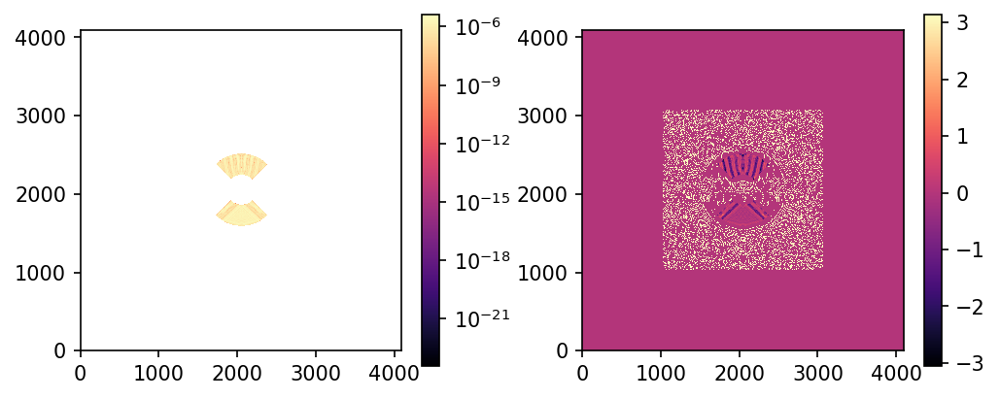

In [36]:
# while at a pupil, switch back to less padding
diam = 2 * proper.prop_get_beamradius(wavefront)
(wavefront, dx) = proper.prop_end( wavefront, NOABS=True )
n = n_from_lyotstop
wavefront = trim(wavefront, n)
if output_field_rootname != '':
    lams = format( lambda_m*1e6, "6.4f" )
    pols = format( int(round(polaxis)) )
    hdu = pyfits.PrimaryHDU()
    hdu.data = np.real(wavefront)
    hdu.writeto( output_field_rootname+'_'+lams+'um_'+pols+'_real.fits', overwrite=True )
    hdu = pyfits.PrimaryHDU()
    hdu.data = np.imag(wavefront)
    hdu.writeto( output_field_rootname+'_'+lams+'um_'+pols+'_imag.fits', overwrite=True )
# if end_at_fpm_exit_pupil == 1:
#     return wavefront, dx
wavefront0 = wavefront.copy()
wavefront = 0
wavefront = proper.prop_begin( diam, lambda_m, n, float(pupil_diam_pix)/n )
wavefront.wfarr[:,:] = proper.prop_shift_center(wavefront0)
wavefront0 = 0
if use_lyot_stop != 0:
    lyot = proper.prop_fits_read( lyot_stop_file )
    lyot = trim( lyot, n )
    if lyot_x_shift_pupdiam != 0 or lyot_y_shift_pupdiam != 0 or lyot_x_shift_m != 0 or lyot_y_shift_m != 0:
        # apply shift to lyot stop by FFTing the stop, applying a tilt, and FFTing back
        if lyot_x_shift_pupdiam != 0 or lyot_y_shift_pupdiam != 0:
            # offsets are normalized to pupil diameter
            xt = -lyot_x_shift_pupdiam * pupil_diam_pix * float(pupil_diam_pix)/n
            yt = -lyot_y_shift_pupdiam * pupil_diam_pix * float(pupil_diam_pix)/n
        else:
            d_m = proper.prop_get_sampling(wavefront)
            xt = -lyot_x_shift_m / d_m * float(pupil_diam_pix)/n
            yt = -lyot_y_shift_m / d_m * float(pupil_diam_pix)/n
        x = np.tile( (np.arange(n)-n//2) / (pupil_diam_pix/2.0), (n,1) )
        y = np.transpose(x)
        tilt = complex(0,1) * np.pi * (x*xt + y*yt)
        x = 0
        y = 0
        lyot = ffts(lyot,-1)
        lyot *= np.exp(tilt)
        lyot = ffts( lyot, 1 )
        lyot = lyot.real
        tilt = 0
    proper.prop_multiply( wavefront, lyot )
    lyot = 0
if use_pupil_lens != 0 or pinhole_diam_m != 0: proper.prop_circular_aperture( wavefront, 1.1, NORM=True )
    
wf_int = np.abs(proper.prop_get_amplitude(wavefront))**2
wf_phase = proper.prop_get_phase(wavefront)
wf_sampling = proper.prop_get_sampling(wavefront)

fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(8,4), dpi=150)
im = ax[0].imshow(wf_int, norm=LogNorm(), cmap=plt.get_cmap('magma'))
fig.colorbar(im, ax=ax[0], shrink=0.8)
im = ax[1].imshow(wf_phase, cmap=plt.get_cmap('magma'))
fig.colorbar(im, ax=ax[1], shrink=0.8)
plt.subplots_adjust(left=None, bottom=None, right=None, top=None, wspace=0.25, hspace=None)

wf = np.zeros(shape=(2,n,n))
wf[0,:,:] = wf_int
wf[1,:,:] = wf_phase

wf_fname = 'wf_lyotstop'
wf_fpath = wf_dir + wf_fname + '_proper' + '.fits'
print(wf_fpath)
hdr = fits.Header()
hdr['PIXELSCL'] = wf_sampling

wf_hdu = fits.PrimaryHDU(wf, header=hdr)
wf_hdu.writeto(wf_fpath, overwrite=True)

# Propagate to OAP7.

Propagating to OAP7
Applying lens
/home/u21/kianmilani/Documents/webbpsf-mydev/spc730-fresnel-wavefronts/wf_oap7_proper.fits


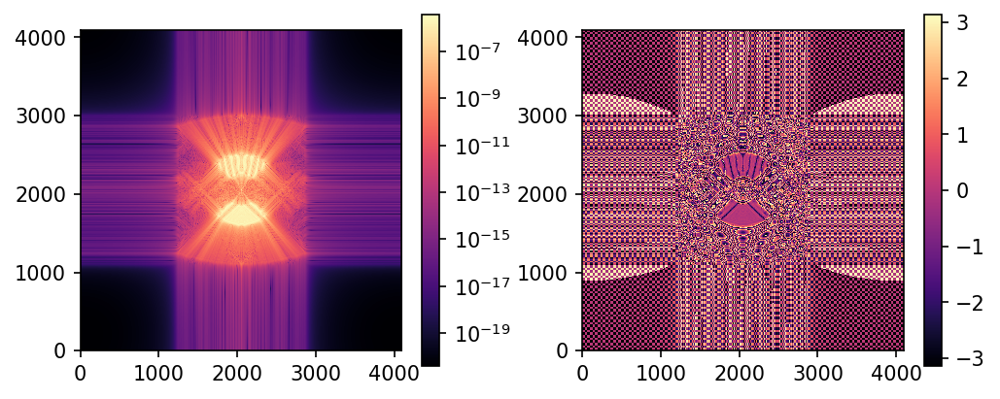

In [37]:
proper.prop_propagate( wavefront, d_lyotstop_oap7, 'OAP7' )
proper.prop_lens( wavefront, fl_oap7 )
if use_errors != 0: proper.prop_errormap( wavefront, map_dir+'wfirst_phaseb_OAP7_phase_error_V1.0.fits', WAVEFRONT=True )
if use_aperture != 0: proper.prop_circular_aperture( wavefront, diam_oap7/2.0 )  
    
wf_int = np.abs(proper.prop_get_amplitude(wavefront))**2
wf_phase = proper.prop_get_phase(wavefront)
wf_sampling = proper.prop_get_sampling(wavefront)

fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(8,4), dpi=150)
im = ax[0].imshow(wf_int, norm=LogNorm(), cmap=plt.get_cmap('magma'))
fig.colorbar(im, ax=ax[0], shrink=0.8)
im = ax[1].imshow(wf_phase, cmap=plt.get_cmap('magma'))
fig.colorbar(im, ax=ax[1], shrink=0.8)
plt.subplots_adjust(left=None, bottom=None, right=None, top=None, wspace=0.25, hspace=None)

wf = np.zeros(shape=(2,n,n))
wf[0,:,:] = wf_int
wf[1,:,:] = wf_phase

wf_fname = 'wf_oap7'
wf_fpath = wf_dir + wf_fname + '_proper' + '.fits'
print(wf_fpath)
hdr = fits.Header()
hdr['PIXELSCL'] = wf_sampling

wf_hdu = fits.PrimaryHDU(wf, header=hdr)
wf_hdu.writeto(wf_fpath, overwrite=True)

# Propagate to Field Stop.

Propagating to FIELD_STOP
/home/u21/kianmilani/Documents/webbpsf-mydev/spc730-fresnel-wavefronts/wf_fieldstop_proper.fits


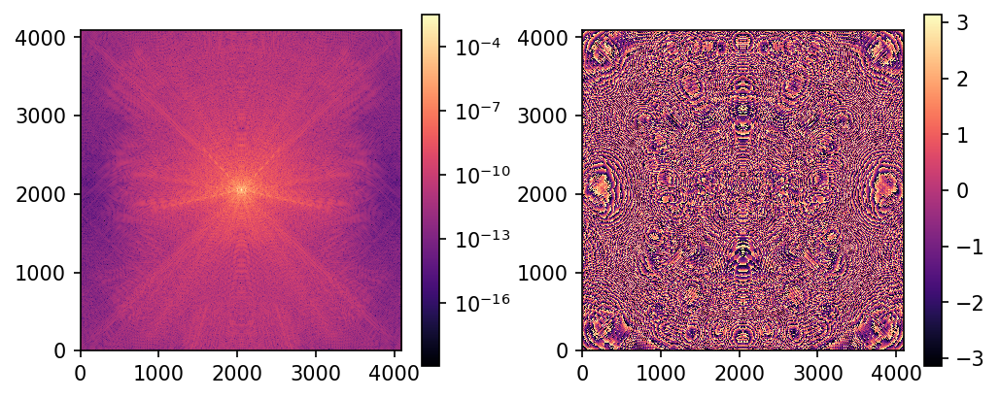

In [38]:
proper.prop_propagate( wavefront, d_oap7_fieldstop, 'FIELD_STOP' )
if use_field_stop != 0 and (cor_type == 'hlc' or cor_type == 'hlc_erkin'):
    sampling_lamD = float(pupil_diam_pix) / n      # sampling at focus in lambda_m/D
    stop_radius = field_stop_radius_lam0 / sampling_lamD * (lambda0_m/lambda_m) * proper.prop_get_sampling(wavefront)
    if field_stop_x_offset != 0 or field_stop_y_offset != 0:
        # convert offsets in lambda0/D to meters
        x_offset_lamD = field_stop_x_offset * lambda0_m / lambda_m
        y_offset_lamD = field_stop_y_offset * lambda0_m / lambda_m
        pupil_ratio = float(pupil_diam_pix) / n
        field_stop_x_offset_m = x_offset_lamD / pupil_ratio * proper.prop_get_sampling(wavefront)
        field_stop_y_offset_m = y_offset_lamD / pupil_ratio * proper.prop_get_sampling(wavefront)
    proper.prop_circular_aperture( wavefront, stop_radius, -field_stop_x_offset_m, -field_stop_y_offset_m )
    
wf_int = np.abs(proper.prop_get_amplitude(wavefront))**2
wf_phase = proper.prop_get_phase(wavefront)
wf_sampling = proper.prop_get_sampling(wavefront)

fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(8,4), dpi=150)
im = ax[0].imshow(wf_int, norm=LogNorm(), cmap=plt.get_cmap('magma'))
fig.colorbar(im, ax=ax[0], shrink=0.8)
im = ax[1].imshow(wf_phase, cmap=plt.get_cmap('magma'))
fig.colorbar(im, ax=ax[1], shrink=0.8)
plt.subplots_adjust(left=None, bottom=None, right=None, top=None, wspace=0.25, hspace=None)

wf = np.zeros(shape=(2,n,n))
wf[0,:,:] = wf_int
wf[1,:,:] = wf_phase

wf_fname = 'wf_fieldstop'
wf_fpath = wf_dir + wf_fname + '_proper' + '.fits'
print(wf_fpath)
hdr = fits.Header()
hdr['PIXELSCL'] = wf_sampling

wf_hdu = fits.PrimaryHDU(wf, header=hdr)
wf_hdu.writeto(wf_fpath, overwrite=True)

# Propagate to OAP8.

Propagating to OAP8
Applying lens
/home/u21/kianmilani/Documents/webbpsf-mydev/spc730-fresnel-wavefronts/wf_oap8_proper.fits


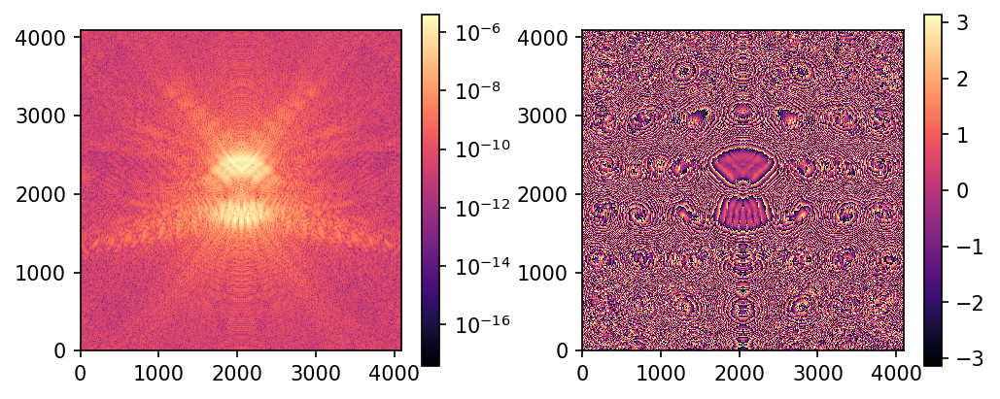

In [39]:
proper.prop_propagate( wavefront, d_fieldstop_oap8, 'OAP8' )
proper.prop_lens( wavefront, fl_oap8 )
if use_errors != 0: proper.prop_errormap( wavefront, map_dir+'wfirst_phaseb_OAP8_phase_error_V1.0.fits', WAVEFRONT=True )
if use_aperture != 0: proper.prop_circular_aperture( wavefront, diam_oap8/2.0 )  
    
wf_int = np.abs(proper.prop_get_amplitude(wavefront))**2
wf_phase = proper.prop_get_phase(wavefront)
wf_sampling = proper.prop_get_sampling(wavefront)

fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(8,4), dpi=150)
im = ax[0].imshow(wf_int, norm=LogNorm(), cmap=plt.get_cmap('magma'))
fig.colorbar(im, ax=ax[0], shrink=0.8)
im = ax[1].imshow(wf_phase, cmap=plt.get_cmap('magma'))
fig.colorbar(im, ax=ax[1], shrink=0.8)
plt.subplots_adjust(left=None, bottom=None, right=None, top=None, wspace=0.25, hspace=None)

wf = np.zeros(shape=(2,n,n))
wf[0,:,:] = wf_int
wf[1,:,:] = wf_phase

wf_fname = 'wf_oap8'
wf_fpath = wf_dir + wf_fname + '_proper' + '.fits'
print(wf_fpath)
hdr = fits.Header()
hdr['PIXELSCL'] = wf_sampling

wf_hdu = fits.PrimaryHDU(wf, header=hdr)
wf_hdu.writeto(wf_fpath, overwrite=True)

# Propagate to filter.

Propagating to filter
/home/u21/kianmilani/Documents/webbpsf-mydev/spc730-fresnel-wavefronts/wf_filter_proper.fits


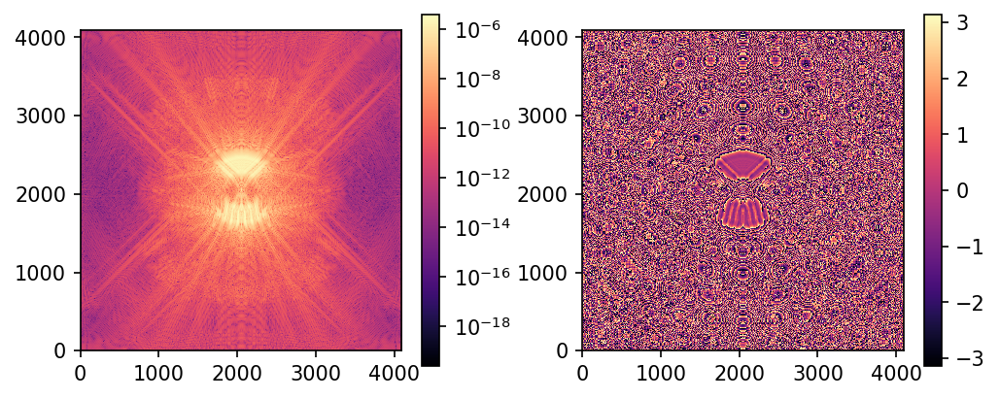

In [40]:
proper.prop_propagate( wavefront, d_oap8_filter, 'filter' )
if use_errors != 0: proper.prop_errormap( wavefront, map_dir+'wfirst_phaseb_FILTER_phase_error_V1.0.fits', WAVEFRONT=True )
if use_aperture != 0: proper.prop_circular_aperture( wavefront, diam_filter/2.0 ) 
    
wf_int = np.abs(proper.prop_get_amplitude(wavefront))**2
wf_phase = proper.prop_get_phase(wavefront)
wf_sampling = proper.prop_get_sampling(wavefront)

fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(8,4), dpi=150)
im = ax[0].imshow(wf_int, norm=LogNorm(), cmap=plt.get_cmap('magma'))
fig.colorbar(im, ax=ax[0], shrink=0.8)
im = ax[1].imshow(wf_phase, cmap=plt.get_cmap('magma'))
fig.colorbar(im, ax=ax[1], shrink=0.8)
plt.subplots_adjust(left=None, bottom=None, right=None, top=None, wspace=0.25, hspace=None)

wf = np.zeros(shape=(2,n,n))
wf[0,:,:] = wf_int
wf[1,:,:] = wf_phase

wf_fname = 'wf_filter'
wf_fpath = wf_dir + wf_fname + '_proper' + '.fits'
print(wf_fpath)
hdr = fits.Header()
hdr['PIXELSCL'] = wf_sampling

wf_hdu = fits.PrimaryHDU(wf, header=hdr)
wf_hdu.writeto(wf_fpath, overwrite=True)

# Propagate to Lens for imaging.

Propagating to LENS
Applying lens
/home/u21/kianmilani/Documents/webbpsf-mydev/spc730-fresnel-wavefronts/wf_lens_proper.fits


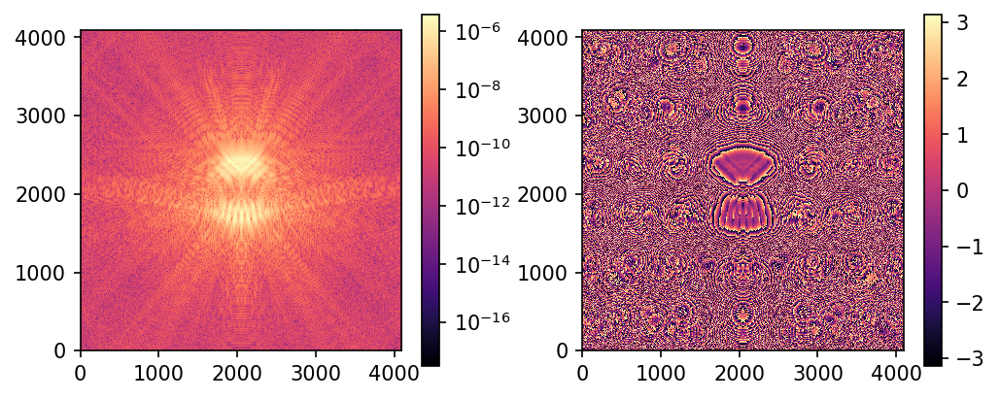

In [41]:
proper.prop_propagate( wavefront, d_filter_lens, 'LENS' )
if use_pupil_lens == 0 and use_defocus_lens == 0 and defocus == 0:
    # use imaging lens to create normal focus
    proper.prop_lens( wavefront, fl_lens )
    if use_errors != 0: proper.prop_errormap( wavefront, map_dir+'wfirst_phaseb_LENS_phase_error_V1.0.fits', WAVEFRONT=True )
elif use_pupil_lens != 0:
    # use pupil imaging lens
    proper.prop_lens( wavefront, fl_pupillens )
    if use_errors != 0: proper.prop_errormap( wavefront, map_dir+'wfirst_phaseb_PUPILLENS_phase_error_V1.0.fits', WAVEFRONT=True )
else:
    # table is waves P-V @ 575 nm
    z4_pv_waves = np.array( [-9.0545,-8.5543,-8.3550,-8.0300,-7.54500,-7.03350,-6.03300,-5.03300,-4.02000,
                             -2.51980,0.00000000,3.028000,4.95000,6.353600,8.030000,10.10500,12.06000,
                             14.06000,20.26000,28.34000,40.77500,56.65700] )
    fl_defocus_lens = np.array( [5.09118,1.89323,1.54206,1.21198,0.914799,0.743569,0.567599,0.470213,0.406973,
                                 0.350755,0.29601868,0.260092,0.24516,0.236606,0.228181,0.219748,0.213278,
                                 0.207816,0.195536,0.185600,0.176629,0.169984] )
    # subtract ad-hoc function to make z4 vs f_length more accurately spline interpolatible
    f = fl_defocus_lens / 0.005
    f0 = 59.203738
    z4t = z4_pv_waves - (0.005*(f0-f-40))/f**2/0.575e-6
    if use_defocus_lens != 0: 
        # use one of 4 defocusing lenses
        defocus = np.array([ 18.0, 9.0, -4.0, -8.0 ])    # waves P-V @ 575 nm
        f = interp1d( z4_pv_waves, z4t, kind='cubic' )
        z4x = f( defocus )
        f = interp1d( z4t, fl_defocus_lens, kind='cubic' )
        lens_fl = f( z4x )
        proper.prop_lens( wavefront, lens_fl[use_defocus_lens-1] ) 
        if use_errors != 0: proper.prop_errormap( wavefront, map_dir+'wfirst_phaseb_DEFOCUSLENS'+str(use_defocus_lens)+'_phase_error_V1.0.fits', WAVEFRONT=True )
        defocus = defocus[use_defocus_lens-1]
    else:
        # specify amount of defocus (P-V waves @ 575 nm)
        f = interp1d( z4_pv_waves, z4t, kind='cubic' )
        z4x = f( defocus )
        f = interp1d( z4t, fl_defocus_lens, kind='cubic' )
        lens_fl = f( z4x )
        proper.prop_lens( wavefront, lens_fl ) 
        if use_errors != 0: proper.prop_errormap( wavefront, map_dir+'wfirst_phaseb_DEFOCUSLENS1_phase_error_V1.0.fits', WAVEFRONT=True )
if use_aperture != 0: proper.prop_circular_aperture( wavefront, diam_lens/2.0 ) 
    
    
wf_int = np.abs(proper.prop_get_amplitude(wavefront))**2
wf_phase = proper.prop_get_phase(wavefront)
wf_sampling = proper.prop_get_sampling(wavefront)

fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(8,4), dpi=150)
im = ax[0].imshow(wf_int, norm=LogNorm(), cmap=plt.get_cmap('magma'))
fig.colorbar(im, ax=ax[0], shrink=0.8)
im = ax[1].imshow(wf_phase, cmap=plt.get_cmap('magma'))
fig.colorbar(im, ax=ax[1], shrink=0.8)
plt.subplots_adjust(left=None, bottom=None, right=None, top=None, wspace=0.25, hspace=None)

wf = np.zeros(shape=(2,n,n))
wf[0,:,:] = wf_int
wf[1,:,:] = wf_phase

wf_fname = 'wf_lens'
wf_fpath = wf_dir + wf_fname + '_proper' + '.fits'
print(wf_fpath)
hdr = fits.Header()
hdr['PIXELSCL'] = wf_sampling

wf_hdu = fits.PrimaryHDU(wf, header=hdr)
wf_hdu.writeto(wf_fpath, overwrite=True)

# Propagate to fourth fold mirror.

Propagating to FOLD_4
/home/u21/kianmilani/Documents/webbpsf-mydev/spc730-fresnel-wavefronts/wf_fold4_proper.fits


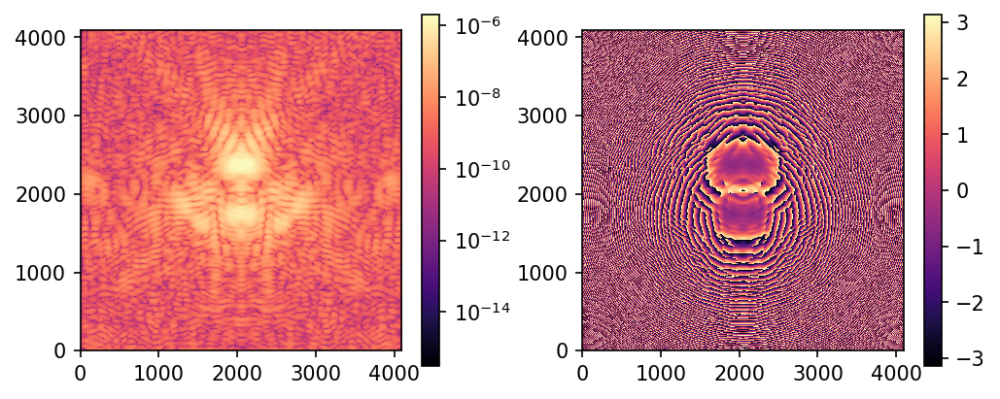

In [42]:
proper.prop_propagate( wavefront, d_lens_fold4, 'FOLD_4' )
if use_errors != 0: proper.prop_errormap( wavefront, map_dir+'wfirst_phaseb_FOLD4_phase_error_V1.1.fits', WAVEFRONT=True )
if use_aperture != 0: proper.prop_circular_aperture( wavefront, diam_fold4/2.0 ) 
    
wf_int = np.abs(proper.prop_get_amplitude(wavefront))**2
wf_phase = proper.prop_get_phase(wavefront)
wf_sampling = proper.prop_get_sampling(wavefront)

fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(8,4), dpi=150)
im = ax[0].imshow(wf_int, norm=LogNorm(), cmap=plt.get_cmap('magma'))
fig.colorbar(im, ax=ax[0], shrink=0.8)
im = ax[1].imshow(wf_phase, cmap=plt.get_cmap('magma'))
fig.colorbar(im, ax=ax[1], shrink=0.8)
plt.subplots_adjust(left=None, bottom=None, right=None, top=None, wspace=0.25, hspace=None)

wf = np.zeros(shape=(2,n,n))
wf[0,:,:] = wf_int
wf[1,:,:] = wf_phase

wf_fname = 'wf_fold4'
wf_fpath = wf_dir + wf_fname + '_proper' + '.fits'
print(wf_fpath)
hdr = fits.Header()
hdr['PIXELSCL'] = wf_sampling

wf_hdu = fits.PrimaryHDU(wf, header=hdr)
wf_hdu.writeto(wf_fpath, overwrite=True)

# Propagate to image plane and employ defocus if there is any.

Propagating to IMAGE
/home/u21/kianmilani/Documents/webbpsf-mydev/spc730-fresnel-wavefronts/wf_image_proper.fits


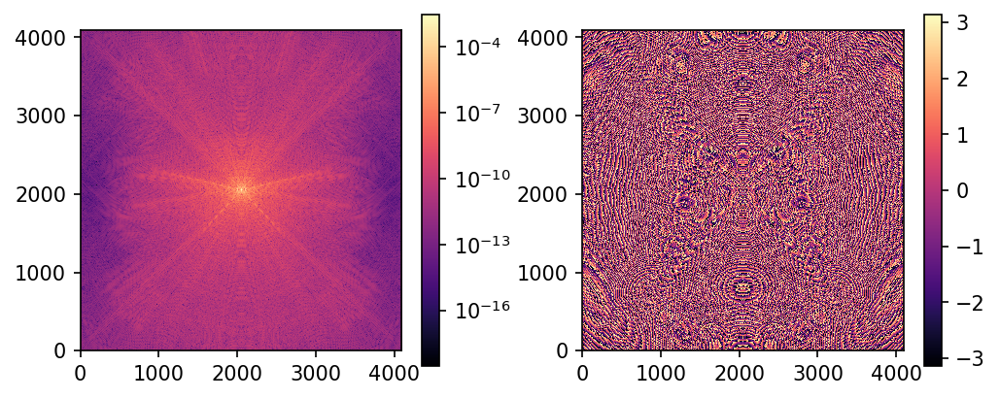

In [43]:
if defocus != 0 or use_defocus_lens != 0:
    if np.abs(defocus) <= 4:
        proper.prop_propagate( wavefront, d_fold4_image, 'IMAGE', TO_PLANE=True )
    else:
        proper.prop_propagate( wavefront, d_fold4_image, 'IMAGE' )
else:
    proper.prop_propagate( wavefront, d_fold4_image, 'IMAGE' )
    
wf_int = np.abs(proper.prop_get_amplitude(wavefront))**2
wf_phase = proper.prop_get_phase(wavefront)
wf_sampling = proper.prop_get_sampling(wavefront)

fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(8,4), dpi=150)
im = ax[0].imshow(wf_int, norm=LogNorm(), cmap=plt.get_cmap('magma'))
fig.colorbar(im, ax=ax[0], shrink=0.8)
im = ax[1].imshow(wf_phase, cmap=plt.get_cmap('magma'))
fig.colorbar(im, ax=ax[1], shrink=0.8)
plt.subplots_adjust(left=None, bottom=None, right=None, top=None, wspace=0.25, hspace=None)

wf = np.zeros(shape=(2,n,n))
wf[0,:,:] = wf_int
wf[1,:,:] = wf_phase

wf_fname = 'wf_image'
wf_fpath = wf_dir + wf_fname + '_proper' + '.fits'
print(wf_fpath)
hdr = fits.Header()
hdr['PIXELSCL'] = wf_sampling

wf_hdu = fits.PrimaryHDU(wf, header=hdr)
wf_hdu.writeto(wf_fpath, overwrite=True)

# Propagation is done, now obtain the final wavefront and adjust sampling as necessary. The wavefront is returned as a complex value given the keyword NOABS=True, therefore the modulus squared of the wavefront must be taken.

In [ ]:
wf_int = np.abs(proper.prop_get_amplitude(wavefront))**2
wf_phase = proper.prop_get_phase(wavefront)
wf_sampling = proper.prop_get_sampling(wavefront)

(wavefront, sampling_m) = proper.prop_end( wavefront, NOABS=True )

if final_sampling_lam0 != 0 or final_sampling_m != 0:
    if final_sampling_m != 0:
        mag = sampling_m / final_sampling_m
        sampling_m = final_sampling_m 
    else:
        mag = (float(pupil_diam_pix)/n) / final_sampling_lam0 * (lambda_m/lambda0_m)
        sampling_m = sampling_m / mag; print(sampling_m)
    wavefront = proper.prop_magnify( wavefront, mag, output_dim, AMP_CONSERVE=True )
    print(wavefront.shape)
    wf_int = proper.prop_magnify( wf_int, mag, output_dim, AMP_CONSERVE=True )
    wf_phase = proper.prop_magnify( wf_phase, mag, output_dim, AMP_CONSERVE=True )
else:
    wavefront = trim(wavefront, output_dim)

print('Computing final image plane intensity.')
image = np.abs(wavefront)**2

exmax = (output_dim/2)*final_sampling_lam0
exmin = -exmax
extent = [exmin,exmax,exmin,exmax]

fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(8,4), dpi=150)
im = ax[0].imshow(wf_int, norm=LogNorm(), cmap=plt.get_cmap('magma'),extent=extent)
fig.colorbar(im, ax=ax[0], shrink=0.8)
circ_in = Circle((0,0),3,edgecolor='c', facecolor='none',lw=1)
circ_out = Circle((0,0),9,edgecolor='c', facecolor='none',lw=1)
ax[0].add_patch(circ_in)
ax[0].add_patch(circ_out)

im = ax[1].imshow(wf_phase, cmap=plt.get_cmap('magma'),extent=extent)
fig.colorbar(im, ax=ax[1], shrink=0.8)
circ_in = Circle((0,0),3,edgecolor='c', facecolor='none',lw=1)
circ_out = Circle((0,0),9,edgecolor='c', facecolor='none',lw=1)
ax[1].add_patch(circ_in)
ax[1].add_patch(circ_out)
plt.subplots_adjust(left=None, bottom=None, right=None, top=None, wspace=0.25, hspace=None)

n = wf_int.shape[0]

wf = np.zeros(shape=(2,n,n))
wf[0,:,:] = wf_int
wf[1,:,:] = wf_phase

wf_fname = 'wf_image_post'
wf_fpath = wf_dir + wf_fname + '_proper' + '.fits'
print(wf_fpath)
hdr = fits.Header()
hdr['PIXELSCL'] = sampling_m

wf_hdu = fits.PrimaryHDU(wf, header=hdr)
wf_hdu.writeto(wf_fpath, overwrite=True)